In [1]:
## Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from shapely.geometry import Point
import seaborn as sns
import geopandas as gpd

In [2]:
plt.style.use('seaborn') 

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\3067490989.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [3]:
pd.set_option('display.max_columns', 150)

In [4]:
districts = gpd.read_file(r'D:\\Data Science\\Code basics\\Challenge\\Challenge_7\\Telangana_Shape_Files\\TS_DISTRICT_BOUNDARIES_33.shp')
districts.head()

,OBJECTID,New_Distri,Shape_Leng,Shape_Area,area,Dist_Name,geometry
0,1,Adilabad,3.688097,0.342293,3977.064388,Adilabad,"POLYGON ((78.33344 19.88466, 78.33378 19.88463..."
1,2,Bhadradri Kothagudem,5.811019,0.594426,6979.436918,Bhadradri Kothagudem,"POLYGON ((80.83670 18.23886, 80.83814 18.23772..."
2,3,Hanumakonda,2.554182,0.141159,1654.041691,Hanumakonda,"POLYGON ((79.70097 18.26708, 79.70057 18.26593..."
3,4,Hyderabad,1.045469,0.015515,182.457101,Hyderabad,"POLYGON ((78.50742 17.48389, 78.50941 17.48292..."
4,5,Jagtial,2.739430,0.244449,2851.813247,Jagtial,"POLYGON ((78.98890 19.07410, 78.99074 19.07366..."


In [5]:
districts.rename(columns={'Dist_Name':'district'}, inplace=True)
districts.head()

,OBJECTID,New_Distri,Shape_Leng,Shape_Area,area,district,geometry
0,1,Adilabad,3.688097,0.342293,3977.064388,Adilabad,"POLYGON ((78.33344 19.88466, 78.33378 19.88463..."
1,2,Bhadradri Kothagudem,5.811019,0.594426,6979.436918,Bhadradri Kothagudem,"POLYGON ((80.83670 18.23886, 80.83814 18.23772..."
2,3,Hanumakonda,2.554182,0.141159,1654.041691,Hanumakonda,"POLYGON ((79.70097 18.26708, 79.70057 18.26593..."
3,4,Hyderabad,1.045469,0.015515,182.457101,Hyderabad,"POLYGON ((78.50742 17.48389, 78.50941 17.48292..."
4,5,Jagtial,2.739430,0.244449,2851.813247,Jagtial,"POLYGON ((78.98890 19.07410, 78.99074 19.07366..."


In [6]:
## Exploring the dim_date dataset
dim_date = pd.read_csv('D:\\Data Science\\Code basics\\Challenge\\Challenge_7\\dataset\\dim_date.csv')
dim_date.head()

,month,Mmm,quarter,fiscal_year
0,2019-04-01,Apr,Q1,2019
1,2019-05-01,May,Q1,2019
2,2019-06-01,Jun,Q1,2019
3,2019-07-01,Jul,Q2,2019
4,2019-08-01,Aug,Q2,2019


In [7]:
## Checking the null values
dim_date.isnull().sum()

month          0
Mmm            0
quarter        0
fiscal_year    0
dtype: int64

In [8]:
## Checking the number of values
dim_date['fiscal_year'].value_counts()

fiscal_year
2019    12
2020    12
2021    12
2022    12
Name: count, dtype: int64

In [9]:
## Converting the String object into datetime object
dim_date['month'] = pd.to_datetime(dim_date['month'])

In [10]:
dim_date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   month        48 non-null     datetime64[ns]
 1   Mmm          48 non-null     object        
 2   quarter      48 non-null     object        
 3   fiscal_year  48 non-null     int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 1.6+ KB


In [11]:
## Setting the month as index for dim_date column
dim_date.set_index('month', inplace=True)

In [12]:
dim_date.loc['2019-04']

,Mmm,quarter,fiscal_year
month,,,
2019-04-01,Apr,Q1,2019


In [13]:
## Getting the dim_districts column
dim_districts = pd.read_csv('D:\\Data Science\\Code basics\\Challenge\\Challenge_7\\dataset\\dim_districts.csv')
dim_districts.head()

,dist_code,district
0,19_1,Adilabad
1,22_2,Bhadradri Kothagudem
2,21_1,Hanumakonda
3,16_1,Hyderabad
4,20_2,Jagtial


In [14]:
## Checking the null values
dim_districts.isnull().sum()

dist_code    0
district     0
dtype: int64

In [15]:
dim_districts.count()

dist_code    33
district     33
dtype: int64

In [16]:
## Getting the fact_stamps file
fact_stamps = pd.read_csv('D:\\Data Science\\Code basics\\Challenge\\Challenge_7\\dataset\\fact_stamps.csv')
fact_stamps.head()

,dist_code,month,documents_registered_cnt,documents_registered_rev,estamps_challans_cnt,estamps_challans_rev
0,14_1,2019-04-01,4533,59236363,0,0
1,17_3,2019-04-01,4151,41508762,0,0
2,20_3,2019-04-01,2116,23674170,0,0
3,21_5,2019-04-01,1089,15915285,0,0
4,23_1,2019-04-01,6133,82593256,0,0


In [17]:
fact_stamps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1504 entries, 0 to 1503
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   dist_code                 1504 non-null   object
 1   month                     1504 non-null   object
 2   documents_registered_cnt  1504 non-null   int64 
 3   documents_registered_rev  1504 non-null   int64 
 4   estamps_challans_cnt      1504 non-null   int64 
 5   estamps_challans_rev      1504 non-null   int64 
dtypes: int64(4), object(2)
memory usage: 70.6+ KB


In [18]:
## Checking the null values
fact_stamps.isnull().sum()

dist_code                   0
month                       0
documents_registered_cnt    0
documents_registered_rev    0
estamps_challans_cnt        0
estamps_challans_rev        0
dtype: int64

In [19]:
fact_stamps['documents_registered_rev'].value_counts()

documents_registered_rev
0            23
1100          5
2200          5
4400          3
8800          3
             ..
81707214      1
17486266      1
200034404     1
62997902      1
132022152     1
Name: count, Length: 1468, dtype: int64

In [20]:
fact_stamps['month'] = pd.to_datetime(fact_stamps['month'])

In [21]:
fact_stamps['documents_registered_cnt'].head()

0    4533
1    4151
2    2116
3    1089
4    6133
Name: documents_registered_cnt, dtype: int64

In [22]:
fact_stamps = pd.merge(fact_stamps, dim_districts, on='dist_code', how='left')
fact_stamps.head()

,dist_code,month,documents_registered_cnt,documents_registered_rev,estamps_challans_cnt,estamps_challans_rev,district
0,14_1,2019-04-01,4533,59236363,0,0,Mahabubnagar
1,17_3,2019-04-01,4151,41508762,0,0,Siddipet
2,20_3,2019-04-01,2116,23674170,0,0,Rajanna Sircilla
3,21_5,2019-04-01,1089,15915285,0,0,Mahabubabad
4,23_1,2019-04-01,6133,82593256,0,0,Nalgonda


In [23]:
fact_stamps['district'].unique()

array(['Mahabubnagar', 'Siddipet', 'Rajanna Sircilla', 'Mahabubabad',
       'Nalgonda', 'Yadadri Bhuvanagiri', 'Karimnagar', 'Peddapalli',
       'Hyderabad', 'Nagarkurnool', 'Medchal_Malkajgiri', 'Mulugu',
       'Bhadradri Kothagudem', 'Jagtial', 'Jogulamba Gadwal', 'Warangal',
       'Khammam', 'Sangareddy', 'Suryapet', 'Kumurambheem Asifabad',
       'Mancherial', 'Kamareddy', 'Adilabad', 'Narayanpet', 'Wanaparthy',
       'Nizamabad', 'Nirmal', 'Hanumakonda', 'Rangareddy', 'Medak',
       'Jangoan', 'Vikarabad'], dtype=object)

In [24]:
revenue = fact_stamps.pivot_table(index=pd.Grouper(freq='Q', key='month'),columns='district', values='documents_registered_rev')

In [25]:
fact_stamps['district'].value_counts()

district
Mahabubnagar             47
Siddipet                 47
Jangoan                  47
Medak                    47
Rangareddy               47
Hanumakonda              47
Nirmal                   47
Nizamabad                47
Wanaparthy               47
Narayanpet               47
Adilabad                 47
Kamareddy                47
Mancherial               47
Kumurambheem Asifabad    47
Suryapet                 47
Sangareddy               47
Khammam                  47
Warangal                 47
Jogulamba Gadwal         47
Jagtial                  47
Bhadradri Kothagudem     47
Mulugu                   47
Medchal_Malkajgiri       47
Nagarkurnool             47
Hyderabad                47
Peddapalli               47
Karimnagar               47
Yadadri Bhuvanagiri      47
Nalgonda                 47
Mahabubabad              47
Rajanna Sircilla         47
Vikarabad                47
Name: count, dtype: int64

In [26]:
revenue.head()

district,Adilabad,Bhadradri Kothagudem,Hanumakonda,Hyderabad,Jagtial,Jangoan,Jogulamba Gadwal,Kamareddy,Karimnagar,Khammam,Kumurambheem Asifabad,Mahabubabad,Mahabubnagar,Mancherial,Medak,Medchal_Malkajgiri,Mulugu,Nagarkurnool,Nalgonda,Narayanpet,Nirmal,Nizamabad,Peddapalli,Rajanna Sircilla,Rangareddy,Sangareddy,Siddipet,Suryapet,Vikarabad,Wanaparthy,Warangal,Yadadri Bhuvanagiri
month,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-06-30,1.309774e+07,1.279872e+07,1.376337e+08,7.417188e+08,2.924719e+07,34584925.0,2.084819e+07,2.938828e+07,6.066829e+07,9.410112e+07,6.277242e+06,1.791645e+07,6.097074e+07,2.800136e+07,4.844680e+07,1.084804e+09,6.100295e+06,2.565105e+07,9.238093e+07,1.285831e+07,2.018123e+07,6.613722e+07,2.952306e+07,2.487746e+07,2.047666e+09,4.110732e+08,4.716283e+07,4.860305e+07,2.762526e+07,1.904718e+07,1.344951e+07,1.271246e+08
2019-09-30,1.620894e+07,1.344025e+07,1.413791e+08,6.345890e+08,3.141900e+07,34517830.0,1.799527e+07,2.876939e+07,6.890392e+07,9.238646e+07,4.594804e+06,1.835692e+07,6.544914e+07,2.903453e+07,3.331830e+07,1.049818e+09,7.961367e+06,2.693101e+07,9.695291e+07,1.439309e+07,1.802954e+07,6.381794e+07,3.000829e+07,2.322660e+07,1.902133e+09,4.190590e+08,5.146547e+07,6.045706e+07,2.883121e+07,2.095839e+07,1.704818e+07,1.333708e+08
2019-12-31,1.407926e+07,1.225259e+07,1.479924e+08,7.113444e+08,2.852750e+07,40990034.0,1.437611e+07,2.383194e+07,7.152839e+07,8.982828e+07,4.188924e+06,1.838106e+07,7.054984e+07,2.731643e+07,3.165210e+07,1.067830e+09,6.517486e+06,2.413650e+07,8.362821e+07,1.293050e+07,1.685718e+07,6.678764e+07,2.640756e+07,2.067639e+07,1.919875e+09,3.442788e+08,4.823592e+07,4.999322e+07,2.786608e+07,1.855280e+07,1.593303e+07,1.140893e+08
2020-03-31,1.597480e+07,1.566409e+07,1.524215e+08,6.788166e+08,2.987615e+07,26402349.0,1.616396e+07,2.672274e+07,6.703344e+07,9.975780e+07,4.084400e+06,1.648930e+07,6.670498e+07,2.845021e+07,3.240647e+07,9.786437e+08,6.204036e+06,2.047413e+07,8.019387e+07,1.305103e+07,1.752421e+07,6.116781e+07,3.164612e+07,2.106359e+07,1.880209e+09,3.581301e+08,3.930734e+07,5.466785e+07,2.520732e+07,1.851821e+07,1.571155e+07,9.867747e+07
2020-06-30,1.050100e+07,9.668685e+06,8.306490e+07,2.289500e+08,1.998350e+07,14339922.0,8.477960e+06,1.616570e+07,4.013338e+07,5.333798e+07,3.576482e+06,1.249804e+07,2.991703e+07,1.432794e+07,1.381120e+07,3.958142e+08,5.084653e+06,1.468841e+07,5.134486e+07,7.193665e+06,1.146994e+07,3.768882e+07,1.987829e+07,1.286249e+07,6.923646e+08,1.122497e+08,2.119459e+07,3.104971e+07,1.104405e+07,1.131958e+07,1.098131e+07,4.911852e+07


# Analysis on Stamp Registration

**1) How does the revenue generated from document registration vary 
across districts in Telangana? List down the top 5 districts that showed 
the highest document registration revenue growth between FY 2019 
and 2022.**

In [27]:
plt.style.use('dark_background') 

In [28]:
# Filter data for FY 2019 and FY 2022
fy_2019 = fact_stamps[fact_stamps['month'].between('2019-04-01', '2020-03-31')]
fy_2022 = fact_stamps[fact_stamps['month'].between('2022-04-01', '2023-03-31')]

# Calculate revenue for FY 2019 and FY 2022
revenue_2019 = fy_2019.groupby('district')['documents_registered_rev'].sum().reset_index()
revenue_2022 = fy_2022.groupby('district')['documents_registered_rev'].sum().reset_index()

# Merge the two DataFrames on district
merged_revenue = pd.merge(revenue_2019, revenue_2022, on='district', suffixes=('_2019', '_2022'))

# Calculate revenue growth for each district
merged_revenue['revenue_growth'] = merged_revenue['documents_registered_rev_2022'] - merged_revenue['documents_registered_rev_2019']

# Select only the district names and their respective revenue growth
result = merged_revenue[['district', 'revenue_growth']]

# Sort the result by revenue growth in descending order
result = result.sort_values(by='revenue_growth', ascending=False)

# Select the top 5 districts with the highest revenue growth
top_5_districts = result.head(5)
top_5_districts['revenue_growth_in_cr'] = round(top_5_districts['revenue_growth'] / 10000000,2)

print(top_5_districts)

              district  revenue_growth  revenue_growth_in_cr
24          Rangareddy     14448100747               1444.81
15  Medchal_Malkajgiri     11500235014               1150.02
3            Hyderabad      5966606163                596.66
25          Sangareddy      3675577001                367.56
2          Hanumakonda      1078958209                107.90


C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\1548549131.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_5_districts['revenue_growth_in_cr'] = round(top_5_districts['revenue_growth'] / 10000000,2)


C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:757: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posx = float(self.convert_xunits(self._x))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:758: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(self._y))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:757: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posx = float(self.convert_xunits(self._x))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:758: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use 

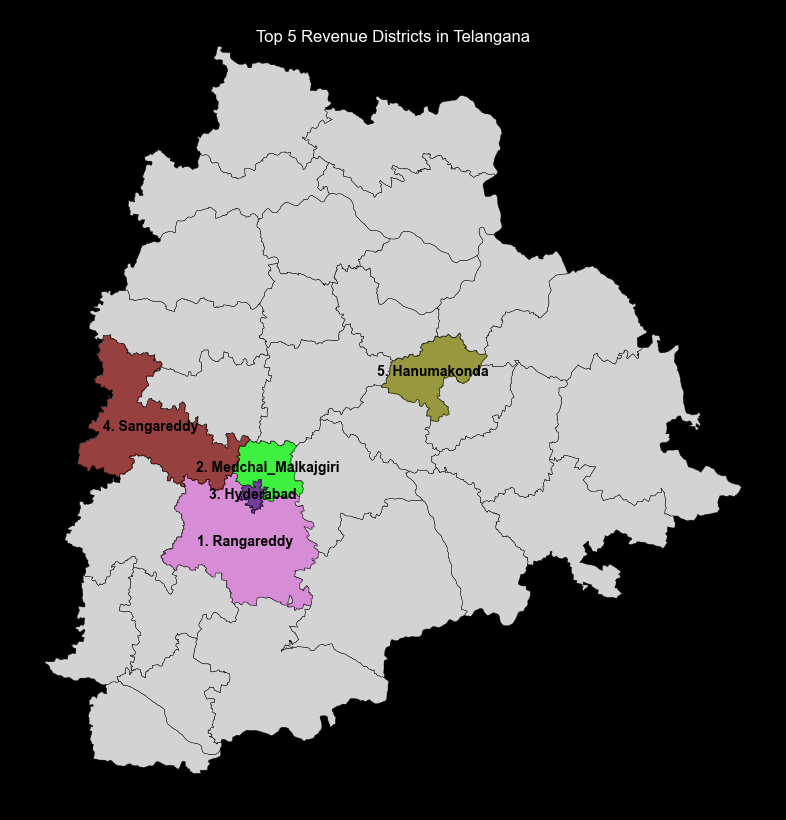

In [29]:
# Reproject the GeoDataFrame to an appropriate projected CRS
districts = districts.to_crs(epsg=32643)  # Replace with the appropriate EPSG code for your desired CRS

# Create a colormap with different colors for the top 5 districts
colors = cycle(['orchid', 'lime', 'indigo', 'maroon', 'olive'])

# Plot the map of Telangana
fig, ax = plt.subplots(figsize=(20, 20))
ax.set_aspect('equal')  # Set the aspect ratio to be equal

# Plot the entire map of Telangana
districts.plot(ax=ax, color='lightgray', edgecolor='black')

# Check if 'top_5_districts' is not empty and contains the 'district' column
if not top_5_districts.empty and 'district' in top_5_districts.columns:
    # Create a cycle of numbers for labeling
    numbers = cycle(range(1, len(top_5_districts) + 1))
    
    # Highlight the top 5 districts on the map with different colors and label with bold text
    for idx, row in top_5_districts.iterrows():
        district_name = row['district']
        number = next(numbers)  # Get the next available number from the cycle
        # Find the corresponding GeoDataFrame for the district name
        gdf_district = districts[districts['district'] == district_name]
        color = next(colors)  # Get the next available color from the cycle
        gdf_district.plot(ax=ax, color=color, edgecolor='black', alpha=0.7)
        # Annotate the district name and position on the map with bold text
        x, y = gdf_district.geometry.centroid.x, gdf_district.geometry.centroid.y
        ax.text(x, y, f"{number}. {district_name}", fontsize=10, ha='center', va='center', fontweight='bold', color='black')

# Add labels
plt.title("Top 5 Revenue Districts in Telangana", y=0.95)
ax.set_xticks([])  # Remove x-axis ticks
ax.set_yticks([])  # Remove y-axis ticks
ax.set_position([0.15, 0.4, 0.7, 0.4])
plt.show()

**2) How does the revenue generated from document registration compare to the revenue generated from e-stamp challans across districts? List 
down the top 5 districts where e-stamps revenue contributes significantly more to the revenue than the documents in FY 2022?**

In [30]:
plt.style.use('dark_background')

C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:1475: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(x))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:1477: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  y = float(self.convert_yunits(y))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:1475: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(x))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\text.py:1477: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) inst

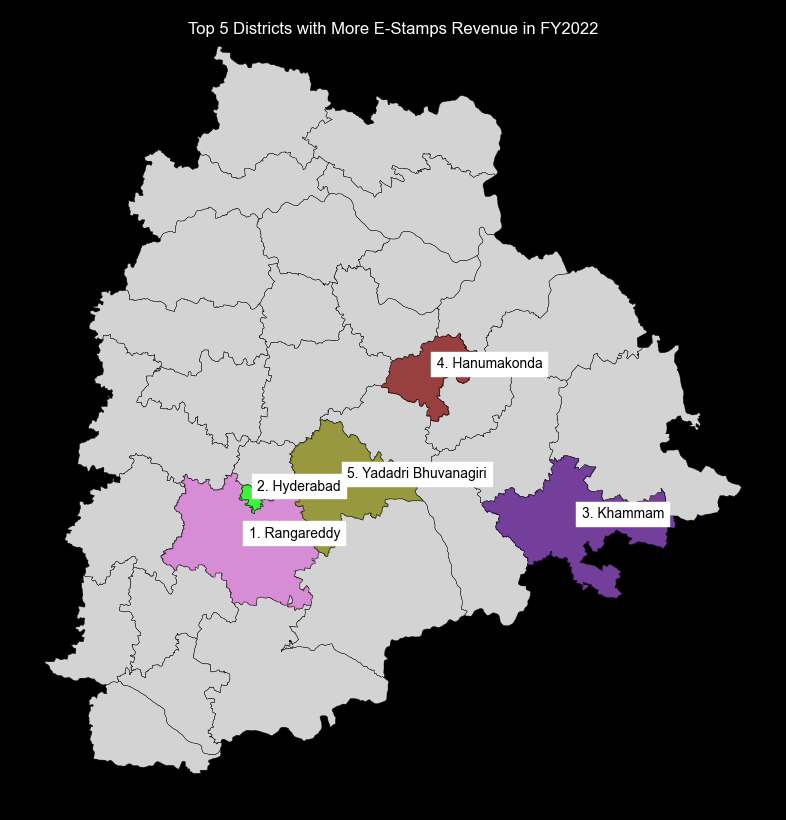

In [31]:
fy_2022_data = fact_stamps[
    (fact_stamps['month'] >= '2022-04-01') & (fact_stamps['month'] <= '2023-03-31')
]

# Calculate total revenue for document registration and e-stamp challans for each district
district_revenue = fy_2022_data.groupby('district').agg({
    'documents_registered_rev': 'sum',
    'estamps_challans_rev': 'sum'
})

# Calculate revenue difference and sort in descending order
district_revenue['revenue_difference'] = district_revenue['estamps_challans_rev'] - district_revenue['documents_registered_rev']
sorted_districts = district_revenue.sort_values(by='revenue_difference', ascending=False)

# Get the top 5 districts based on the revenue difference
top_significant_districts = sorted_districts.head(5)

# Create a GeoDataFrame for top significant districts
top_districts = gpd.GeoDataFrame(
    top_significant_districts, 
    geometry=[Point(0, 0)] * len(top_significant_districts),  # Dummy geometry, you can replace with actual geometries
    crs='EPSG:4326'  # Replace with the appropriate CRS code for your data
)

# Plotting on Map
fig, ax = plt.subplots(figsize=(20, 20))
ax.set_aspect('equal')  # Set the aspect ratio to be equal

# Plot the map of your region (e.g., Telangana) with districts in light gray
districts.plot(ax=ax, color='lightgray', edgecolor='black')

# Highlight the top significant districts on the map with different colors and label them
colors = ['orchid', 'lime', 'indigo', 'maroon', 'olive']

for idx, (district_name, revenue_diff) in enumerate(top_significant_districts.iterrows()):
    gdf_district = districts[districts['district'] == district_name]
    gdf_district.plot(ax=ax, color=colors[idx], edgecolor='black', alpha=0.7)
    
    # Add labels with district name and position number
    ax.annotate(f'{idx + 1}. {district_name}', 
                xy=(gdf_district.geometry.centroid.x, gdf_district.geometry.centroid.y), 
                xytext=(3, 3), 
                textcoords='offset points',
                fontsize=10,
                color='black',
                backgroundcolor='white')

# Additional plot elements
plt.title("Top 5 Districts with More E-Stamps Revenue in FY2022", y=0.96)  # Modify the title here
ax.set_xticks([])  # Remove x-axis ticks
ax.set_yticks([])  # Remove y-axis ticks
ax.set_position([0.15, 0.4, 0.7, 0.4])
plt.show()

In [32]:
top_significant_districts

,documents_registered_rev,estamps_challans_rev,revenue_difference
district,,,
Rangareddy,37697750946,38349357618,651606672
Hyderabad,14266012441,14374315032,108302591
Khammam,1971647539,2002220314,30572775
Hanumakonda,2817238587,2846856844,29618257
Yadadri Bhuvanagiri,2167480603,2185270667,17790064


In [33]:
top_significant_districts['documents_registered_rev'] = round(top_significant_districts['documents_registered_rev']/10000000,2)
top_significant_districts['estamps_challans_rev'] = round(top_significant_districts['estamps_challans_rev']/10000000,2)
top_significant_districts['revenue_difference'] = round(top_significant_districts['revenue_difference']/10000000,2)
top_significant_districts

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\2746622870.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_significant_districts['documents_registered_rev'] = round(top_significant_districts['documents_registered_rev']/10000000,2)
C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\2746622870.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_significant_districts['estamps_challans_rev'] = round(top_significant_districts['estamps_challans_rev']/10000000,2)
C:\Users\Admin\AppData\Local\Temp\ipyker

,documents_registered_rev,estamps_challans_rev,revenue_difference
district,,,
Rangareddy,3769.78,3834.94,65.16
Hyderabad,1426.60,1437.43,10.83
Khammam,197.16,200.22,3.06
Hanumakonda,281.72,284.69,2.96
Yadadri Bhuvanagiri,216.75,218.53,1.78


In [34]:
plt.style.use('seaborn')

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\240305066.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


**3) Is there any alteration of e-Stamp challan count and document registration count pattern since the implementation of e-Stamp 
challan? If so, what suggestions would you propose to the government?**


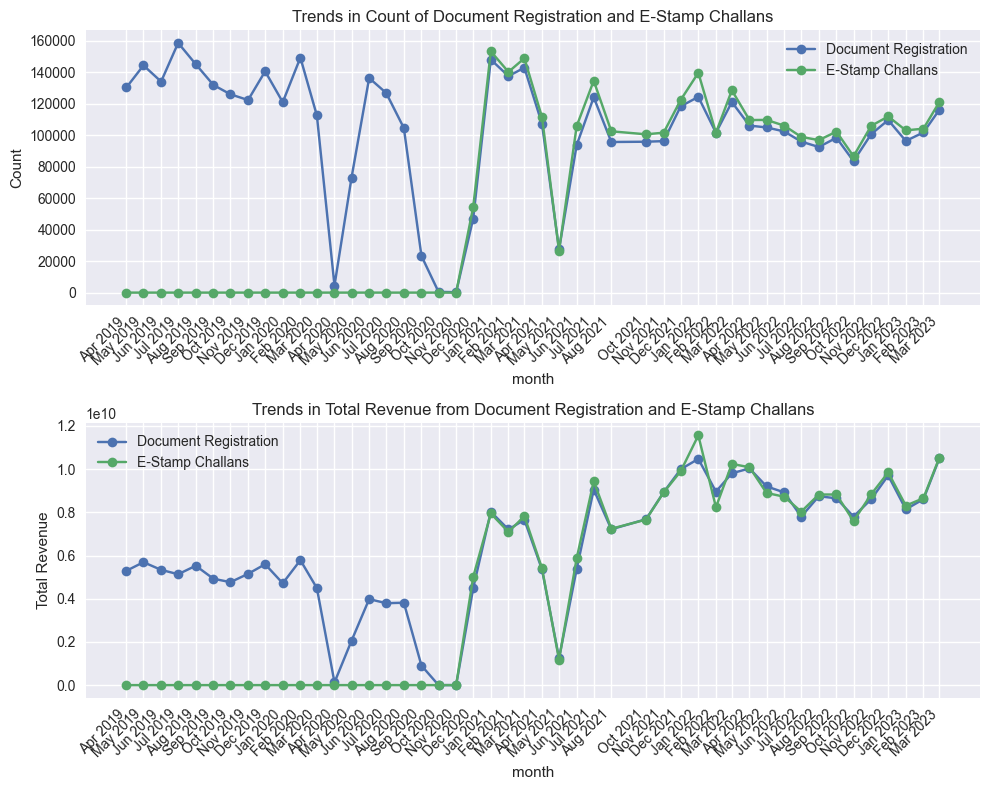

In [35]:
# Group data on a relevant time scale (e.g., yearly or monthly)
grouped_data = fact_stamps.groupby(fact_stamps['month']).agg({
    'documents_registered_cnt': 'sum',
    'estamps_challans_cnt': 'sum',
    'documents_registered_rev': 'sum',  
    'estamps_challans_rev': 'sum'        
}).reset_index()
grouped_data.dropna(inplace=True)
# Plotting trends
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# First plot (count)
grouped_data.plot(x='month', y=['documents_registered_cnt', 'estamps_challans_cnt'], ax=axes[0], marker='o')
axes[0].set_ylabel('Count')
axes[0].legend(['Document Registration', 'E-Stamp Challans'])
axes[0].set_title('Trends in Count of Document Registration and E-Stamp Challans')

# Second plot (total revenue)
grouped_data.plot(x='month', y=['documents_registered_rev', 'estamps_challans_rev'], ax=axes[1], marker='o')
axes[1].set_ylabel('Total Revenue')
axes[1].legend(['Document Registration', 'E-Stamp Challans'])
axes[1].set_title('Trends in Total Revenue from Document Registration and E-Stamp Challans')

# Set x-axis tick locations and labels for both plots
for ax in axes:
    ax.set_xticks(grouped_data['month'].dropna())
    ax.set_xticklabels(grouped_data['month'].dt.strftime('%b %Y').dropna(), rotation=45)

plt.tight_layout()
plt.show()

In [36]:
grouped_data.reset_index(inplace=True)

In [37]:
grouped_data[grouped_data['month']=='2021-09-01']

,index,month,documents_registered_cnt,estamps_challans_cnt,documents_registered_rev,estamps_challans_rev


**4) Categorize districts into three segments based on their stamp registration revenue generation during the fiscal year 2021 to 2022.**

In [38]:
fact_stamps['district'].unique()

array(['Mahabubnagar', 'Siddipet', 'Rajanna Sircilla', 'Mahabubabad',
       'Nalgonda', 'Yadadri Bhuvanagiri', 'Karimnagar', 'Peddapalli',
       'Hyderabad', 'Nagarkurnool', 'Medchal_Malkajgiri', 'Mulugu',
       'Bhadradri Kothagudem', 'Jagtial', 'Jogulamba Gadwal', 'Warangal',
       'Khammam', 'Sangareddy', 'Suryapet', 'Kumurambheem Asifabad',
       'Mancherial', 'Kamareddy', 'Adilabad', 'Narayanpet', 'Wanaparthy',
       'Nizamabad', 'Nirmal', 'Hanumakonda', 'Rangareddy', 'Medak',
       'Jangoan', 'Vikarabad'], dtype=object)

In [39]:
# Filter data for fiscal year 2021 to 2022 (Apr 1 to Mar 31)
fy_start_date = pd.Timestamp('2021-04-01')
fy_end_date = pd.Timestamp('2023-03-31')
fy_2021_2022_data = fact_stamps[(fact_stamps['month'] >= fy_start_date) & (fact_stamps['month'] <= fy_end_date)]

# Calculate total stamp registration revenue for each district
district_revenue = round(fy_2021_2022_data.groupby('district')['documents_registered_rev'].sum()/10000000, 2)

# Determine revenue thresholds for segmenting
revenue_percentiles = district_revenue.quantile([0.48, 0.89])

# Function to categorize districts into segments
def categorize_revenue_segment(revenue):
    if revenue <= revenue_percentiles[0.48]:
        return 'Low'
    elif revenue <= revenue_percentiles[0.89]:
        return 'Medium'
    else:
        return 'High'

# Create a new DataFrame with the revenue segments
district_segments = pd.DataFrame({'district': district_revenue.index, 'documents_registered_rev': district_revenue.values,
                                  'revenue_segment': district_revenue.apply(categorize_revenue_segment).values})

# Sort the DataFrame based on the 'documents_registered_rev' column
sorted_district_segments = district_segments.sort_values(by='documents_registered_rev', ascending=False)

print(sorted_district_segments)

                 district  documents_registered_rev revenue_segment
24             Rangareddy                   6956.32            High
15     Medchal_Malkajgiri                   4224.44            High
3               Hyderabad                   2497.79            High
25             Sangareddy                   1461.76            High
2             Hanumakonda                    489.50          Medium
31    Yadadri Bhuvanagiri                    378.71          Medium
9                 Khammam                    361.52          Medium
8              Karimnagar                    261.91          Medium
21              Nizamabad                    259.27          Medium
18               Nalgonda                    258.66          Medium
12           Mahabubnagar                    196.00          Medium
27               Suryapet                    180.30          Medium
26               Siddipet                    174.19          Medium
14                  Medak                    112

In [40]:
sorted_district_segments

,district,documents_registered_rev,revenue_segment
24,Rangareddy,6956.32,High
15,Medchal_Malkajgiri,4224.44,High
3,Hyderabad,2497.79,High
25,Sangareddy,1461.76,High
2,Hanumakonda,489.50,Medium
31,Yadadri Bhuvanagiri,378.71,Medium
9,Khammam,361.52,Medium
8,Karimnagar,261.91,Medium
21,Nizamabad,259.27,Medium
18,Nalgonda,258.66,Medium


In [41]:
plt.style.use('dark_background')

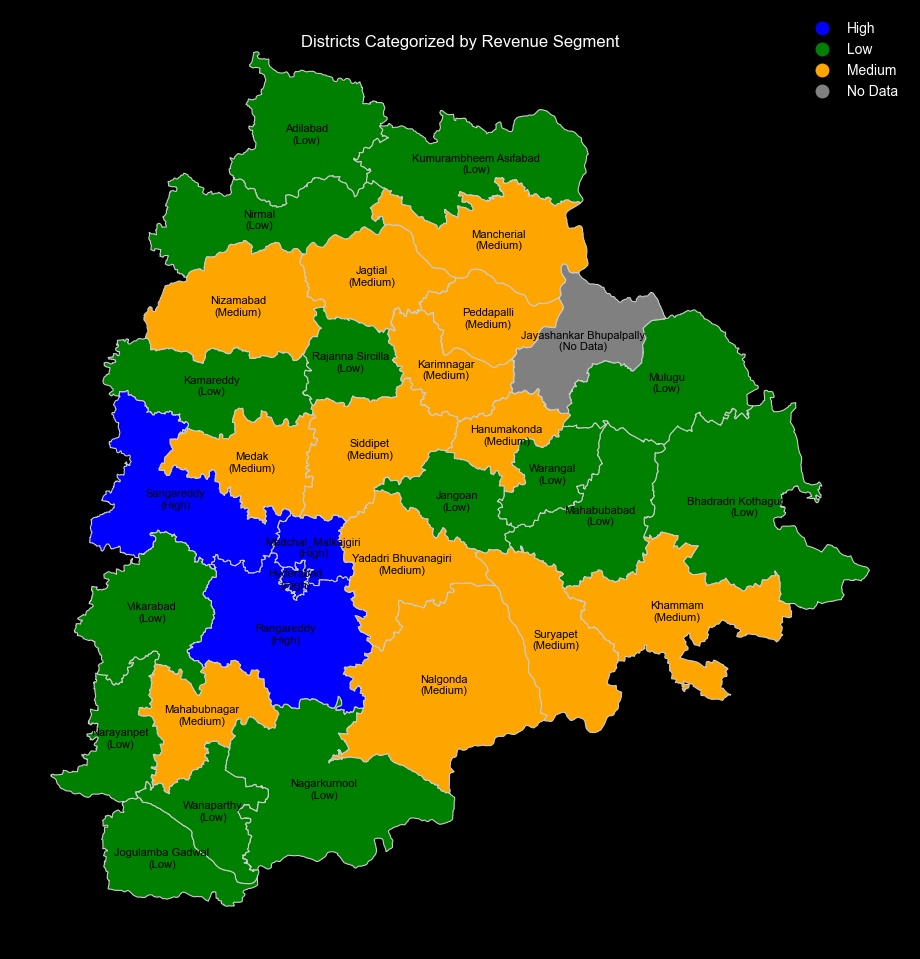

In [42]:
# Merge the 'districts' GeoDataFrame with the 'district_segments' DataFrame based on the 'district' column
merged_data = districts.merge(district_segments, on='district', how='left')

# Fill missing 'revenue_segment' values with 'No Data' and replace NaN with 'No Data'
merged_data['revenue_segment'] = merged_data['revenue_segment'].fillna('No Data')

# Define your own colors for revenue segments, including 'No Data'
segment_colors = {
    'High': 'blue',
    'Medium': 'green',
    'Low': 'orange',
    'No Data': 'gray'
}

# Create a colormap using the specified colors
cmap = ListedColormap([segment_colors[category] for category in segment_colors])

# Plotting on Map
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_aspect('equal')  # Set the aspect ratio to be equal

# Plot the choropleth map with revenue segments
merged_data.plot(column='revenue_segment', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Add district names and revenue segment colors
for idx, row in merged_data.iterrows():
    district_name = row['district']
    revenue_segment = row['revenue_segment']
    x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
    ax.text(x, y, f"{district_name}\n({revenue_segment})", fontsize=8, ha='center', va='center', color='black')

# Additional plot elements
plt.suptitle("Districts Categorized by Revenue Segment", y=0.93)
ax.set_xticks([])  # Remove x-axis ticks
ax.set_yticks([])  # Remove y-axis ticks

# Adjust the position of the map on the y-axis
ax.set_position([0.15, 0.4, 0.7, 0.4])  # [left, bottom, width, height]

# Show the plot
plt.tight_layout()
plt.show()

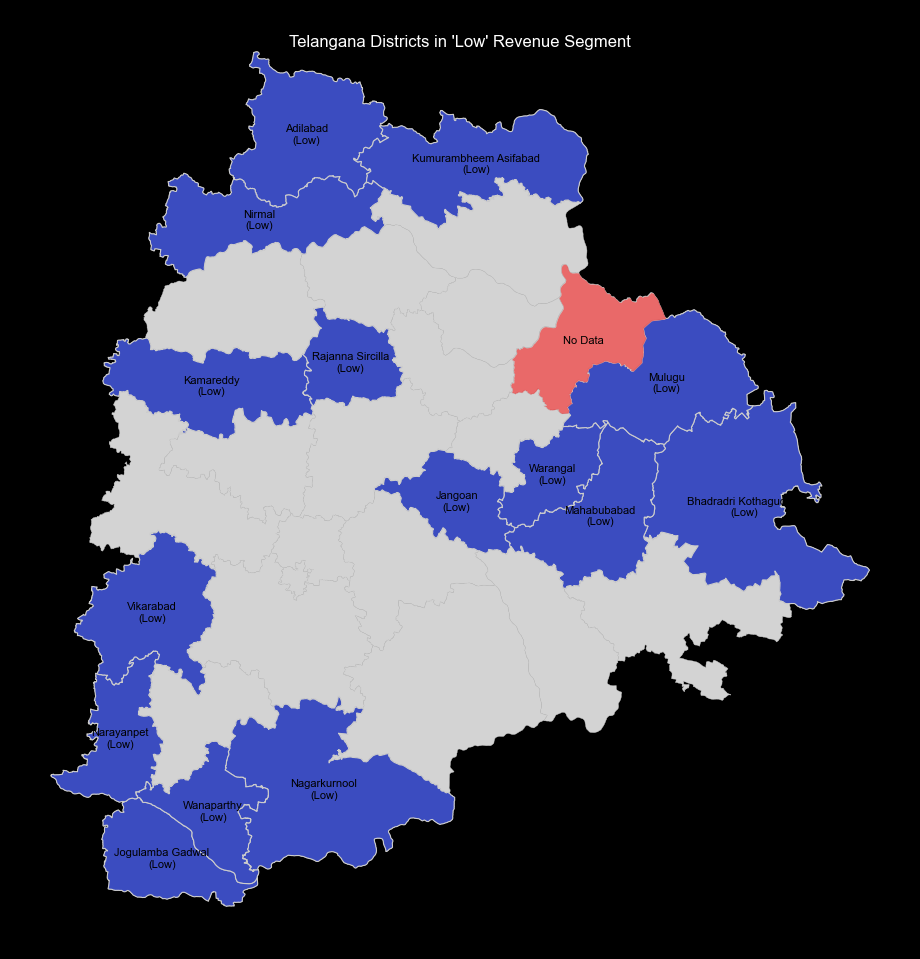

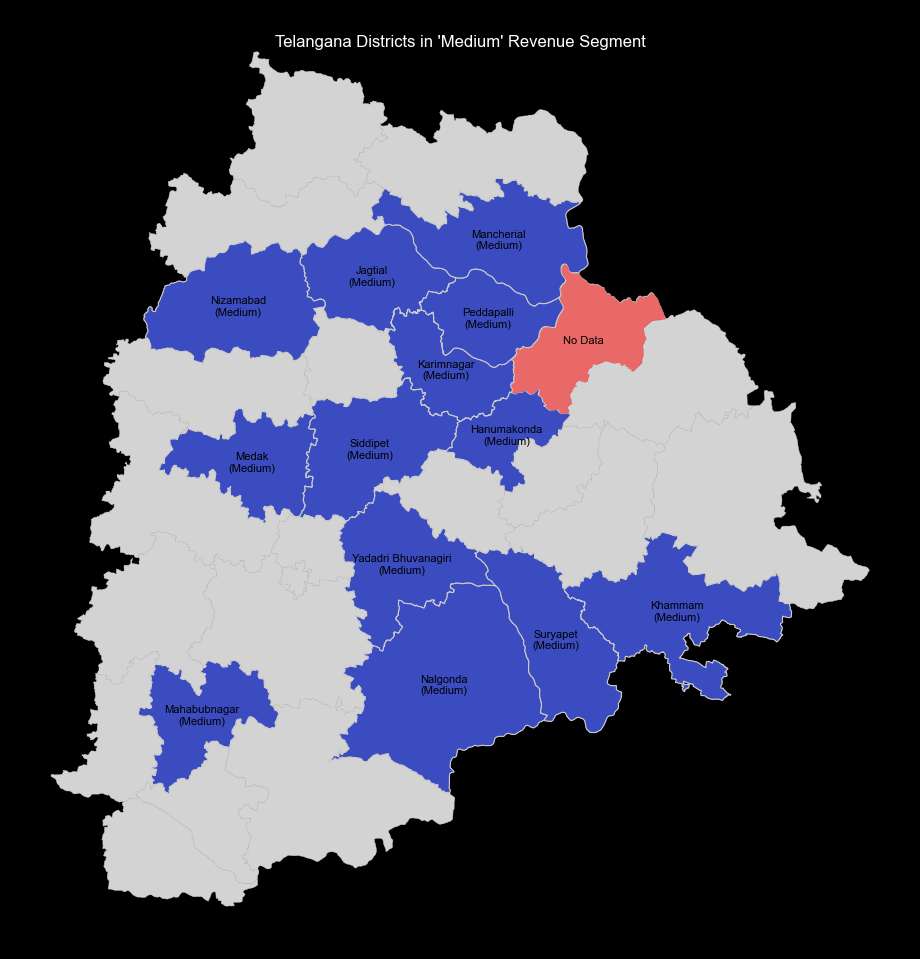

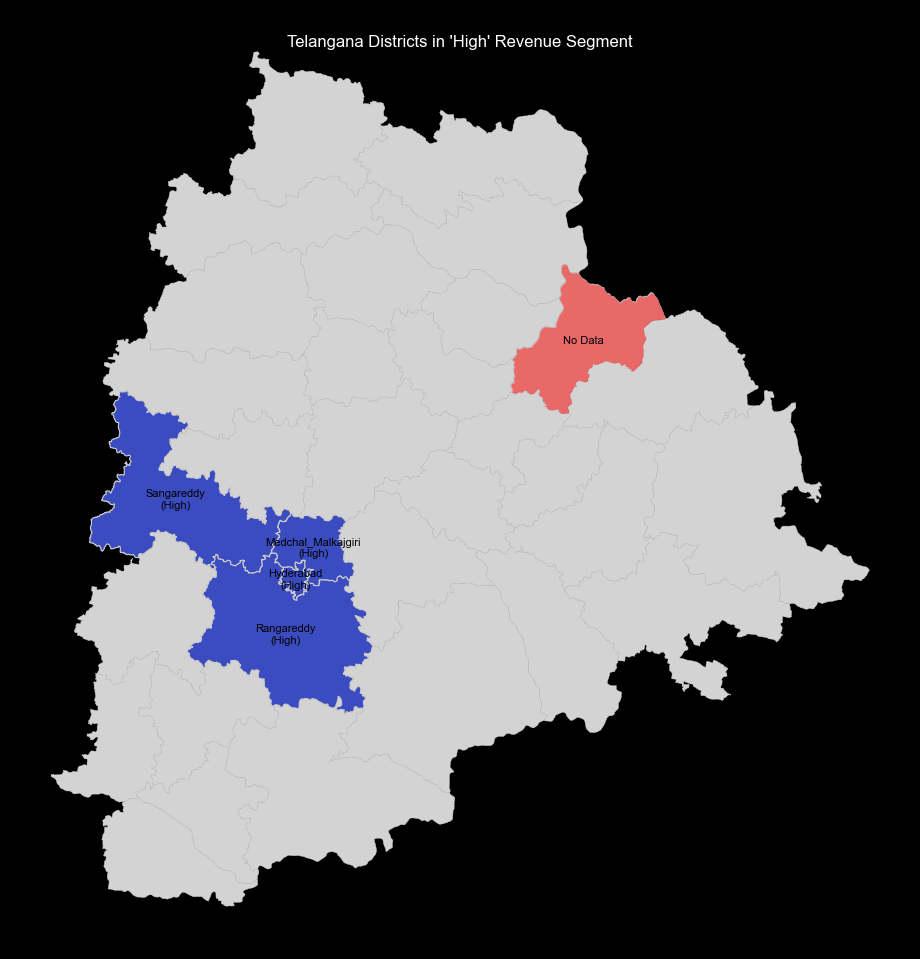

In [43]:
# Get unique revenue segments (excluding 'No Data')
unique_segments = merged_data['revenue_segment'].unique()
unique_segments = [s for s in unique_segments if s != 'No Data']

# Load the base map of Telangana districts from the 'districts' GeoDataFrame
base_map = districts.copy()

# Loop through each revenue segment category
for segment_category in unique_segments:
    # Filter the data for the current category
    data_category = merged_data[merged_data['revenue_segment'] == segment_category]

    # Create a new plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_aspect('equal')  # Set the aspect ratio to be equal

    # Plot the base map of Telangana districts
    base_map.plot(ax=ax, color='lightgray', edgecolor='0.8')

    # Plot the districts for the current category on top of the base map without legend
    data_category.plot(column='revenue_segment', cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.8')

    # Add district names and revenue segment colors
    for idx, row in data_category.iterrows():
        district_name = row['district']
        revenue_segment = row['revenue_segment']
        x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
        ax.text(x, y, f"{district_name}\n({revenue_segment})", fontsize=8, ha='center', va='center', color='black')

    # Overlay "No Data" districts with a different color
    no_data_districts = merged_data[merged_data['revenue_segment'] == 'No Data']
    no_data_districts.plot(ax=ax, color='red', edgecolor='0.8', alpha=0.5)

    # Add the label "No Data" to the map
    for idx, row in no_data_districts.iterrows():
        district_name = row['district']
        x, y = row['geometry'].centroid.x, row['geometry'].centroid.y
        ax.text(x, y, "No Data", fontsize=8, ha='center', va='center', color='black')

    # Set the title for the current category
    plt.suptitle(f"Telangana Districts in '{segment_category}' Revenue Segment", y=0.93)

    # Remove grid lines
    ax.grid(False)

    # Remove x and y-axis
    ax.set_xticks([])
    ax.set_yticks([])

    # Show the plot
    plt.tight_layout()
    plt.show()

# Analysis on Transport

**5. Investigate whether there is any correlation between vehicle sales and 
specific months or seasons in different districts. Are there any months 
or seasons that consistently show higher or lower sales rate, and if yes, 
what could be the driving factors? (Consider Fuel-Type category only)**

In [44]:
fact_transport = pd.read_csv('D:\\Data Science\\Code basics\\Challenge\\Challenge_7\\dataset\\fact_transport.csv')
fact_transport.head()

,dist_code,month,fuel_type_petrol,fuel_type_diesel,fuel_type_electric,fuel_type_others,vehicleClass_MotorCycle,vehicleClass_MotorCar,vehicleClass_AutoRickshaw,vehicleClass_Agriculture,vehicleClass_others,seatCapacity_1_to_3,seatCapacity_4_to_6,seatCapacity_above_6,Brand_new_vehicles,Pre-owned_vehicles,category_Non-Transport,category_Transport
0,15_1,2019-04-01,17910,3011,76,22,15308,4429,0,4,1278,16110,4182,717,19542,1477,19856,1163
1,18_2,2019-04-01,3066,306,6,0,2995,142,49,64,128,3156,189,33,3322,56,3203,175
2,20_3,2019-04-01,1577,215,0,0,1546,79,29,21,117,1683,104,5,1751,41,1648,144
3,21_3,2019-04-01,1961,281,2,0,1939,72,72,48,113,2082,146,16,2209,35,2075,169
4,21_7,2019-04-01,1552,309,0,0,1512,76,69,109,95,1696,145,20,1820,41,1701,160


In [45]:
fact_transport = pd.merge(fact_transport, dim_districts, on='dist_code', how='left')
fact_transport.head()

,dist_code,month,fuel_type_petrol,fuel_type_diesel,fuel_type_electric,fuel_type_others,vehicleClass_MotorCycle,vehicleClass_MotorCar,vehicleClass_AutoRickshaw,vehicleClass_Agriculture,vehicleClass_others,seatCapacity_1_to_3,seatCapacity_4_to_6,seatCapacity_above_6,Brand_new_vehicles,Pre-owned_vehicles,category_Non-Transport,category_Transport,district
0,15_1,2019-04-01,17910,3011,76,22,15308,4429,0,4,1278,16110,4182,717,19542,1477,19856,1163,Rangareddy
1,18_2,2019-04-01,3066,306,6,0,2995,142,49,64,128,3156,189,33,3322,56,3203,175,Kamareddy
2,20_3,2019-04-01,1577,215,0,0,1546,79,29,21,117,1683,104,5,1751,41,1648,144,Rajanna Sircilla
3,21_3,2019-04-01,1961,281,2,0,1939,72,72,48,113,2082,146,16,2209,35,2075,169,Jangoan
4,21_7,2019-04-01,1552,309,0,0,1512,76,69,109,95,1696,145,20,1820,41,1701,160,Jayashankar Bhupalpally


In [46]:
fact_transport.isnull().sum()

dist_code                    0
month                        0
fuel_type_petrol             0
fuel_type_diesel             0
fuel_type_electric           0
fuel_type_others             0
vehicleClass_MotorCycle      0
vehicleClass_MotorCar        0
vehicleClass_AutoRickshaw    0
vehicleClass_Agriculture     0
vehicleClass_others          0
seatCapacity_1_to_3          0
seatCapacity_4_to_6          0
seatCapacity_above_6         0
Brand_new_vehicles           0
Pre-owned_vehicles           0
category_Non-Transport       0
category_Transport           0
district                     0
dtype: int64

In [47]:
fact_transport['month'] = pd.to_datetime(fact_transport['month'])

In [48]:
plt.style.use('seaborn')

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\240305066.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [49]:
fact_transport.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   dist_code                  1440 non-null   object        
 1   month                      1440 non-null   datetime64[ns]
 2   fuel_type_petrol           1440 non-null   int64         
 3   fuel_type_diesel           1440 non-null   int64         
 4   fuel_type_electric         1440 non-null   int64         
 5   fuel_type_others           1440 non-null   int64         
 6   vehicleClass_MotorCycle    1440 non-null   int64         
 7   vehicleClass_MotorCar      1440 non-null   int64         
 8   vehicleClass_AutoRickshaw  1440 non-null   int64         
 9   vehicleClass_Agriculture   1440 non-null   int64         
 10  vehicleClass_others        1440 non-null   int64         
 11  seatCapacity_1_to_3        1440 non-null   int64         
 12  seatCa

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\3619090074.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))
C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\3619090074.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))
C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\3619090074.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))
C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\3619090074.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y'

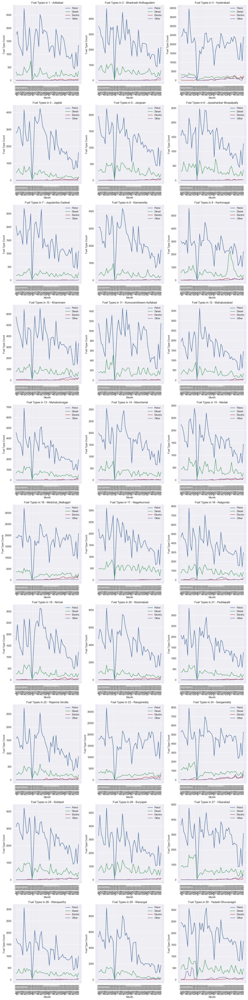

In [50]:
pivot_data = fact_transport.pivot_table(index=['month', 'district'], values=['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric', 'fuel_type_others'], aggfunc='sum')

districts = pivot_data.index.get_level_values('district').unique()

# Calculate the number of rows and columns needed for the subplots
num_districts = len(districts)
num_cols = 3  # You can adjust the number of columns as needed
num_rows = -(-num_districts // num_cols)  # Ceiling division

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6*num_rows))
axes = axes.flatten()  # Flatten the 2D array of axes

for i, district in enumerate(districts):
    ax = axes[i]
    subset = pivot_data.xs(district, level='district')

    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_petrol'], label='Petrol')
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_diesel'], label='Diesel')
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_electric'], label='Electric')
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_others'], label='Other')

    ax.set_title(f'Fuel Types in {i + 1} - {district}')
    ax.set_xlabel('Month')
    ax.set_ylabel('Fuel Type Count')
    ax.legend()

    # Format the x-axis ticks to show only month and year
    ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))
    ax.set_xticks(subset.index.get_level_values('month'))

    ax.tick_params(axis='x', rotation=90)
    
plt.tight_layout()
# Save the plot to an image file (e.g., PNG format)
# plt.savefig('fuel_type_subplots.png')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


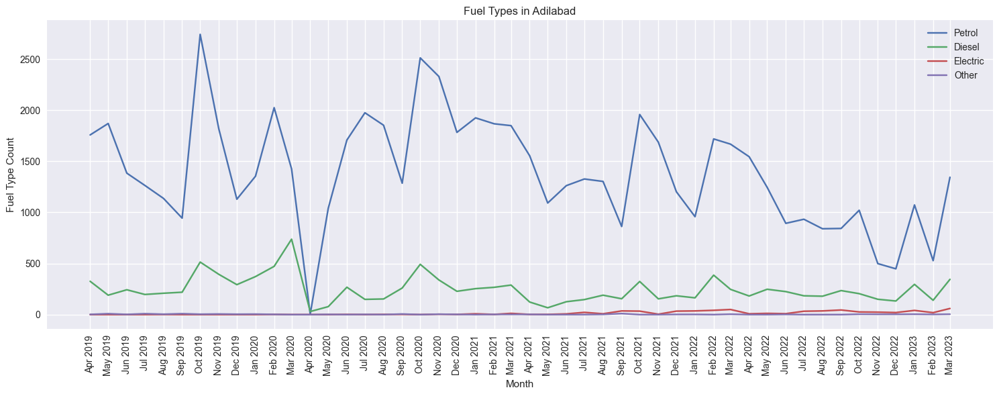

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


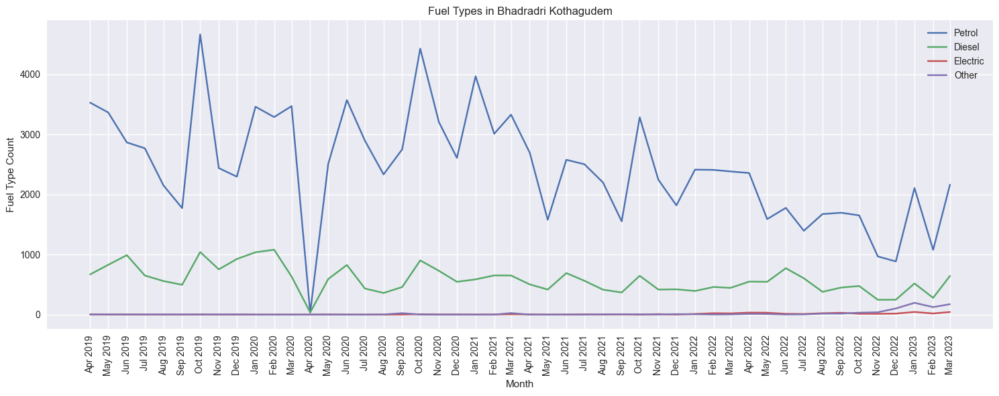

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


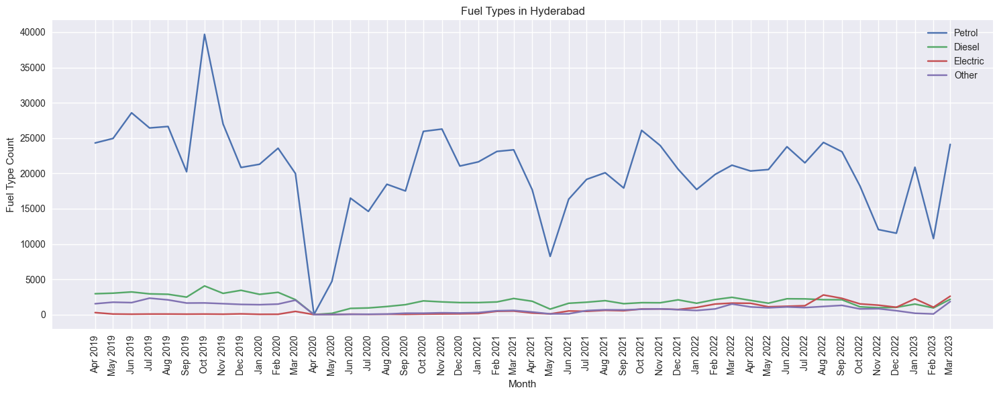

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


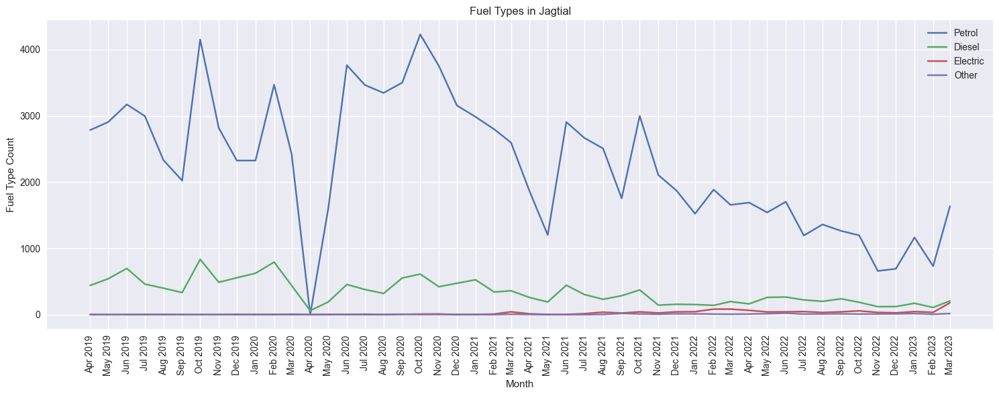

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


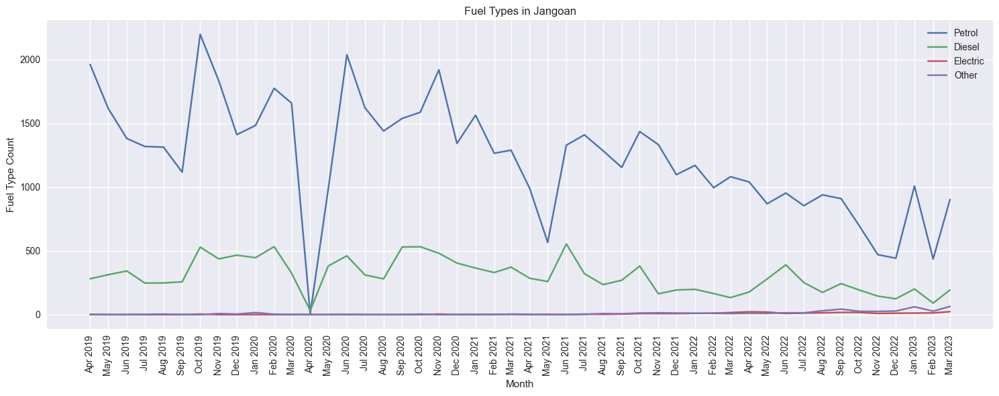

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


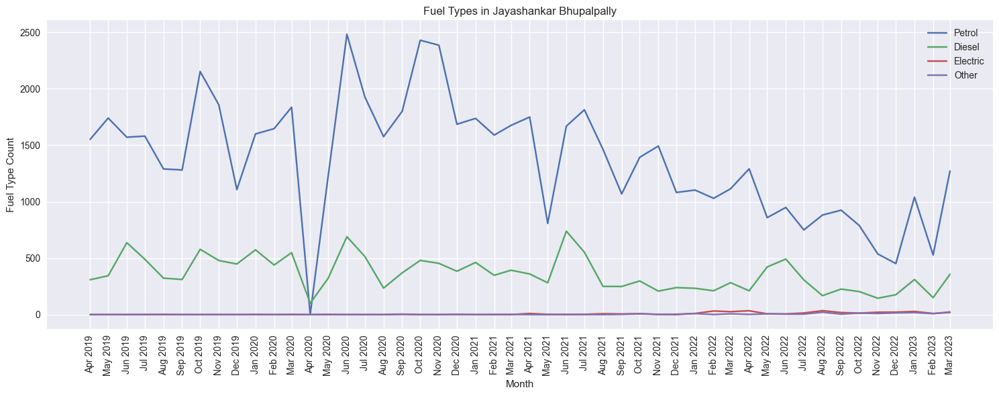

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


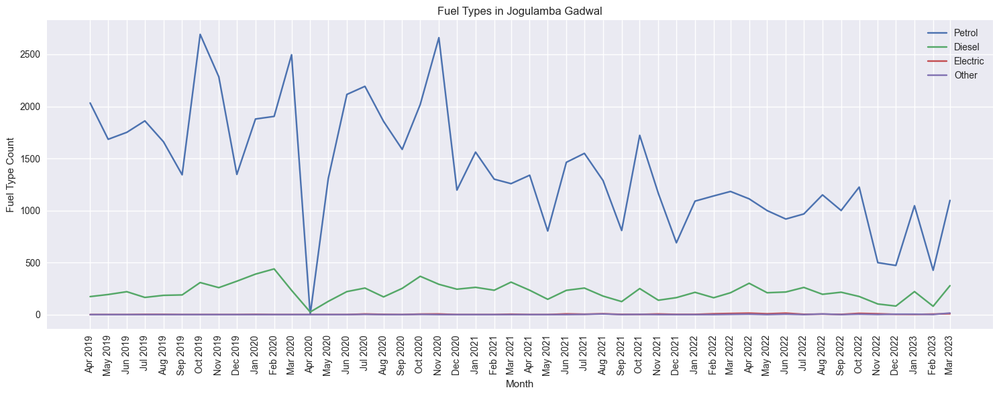

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


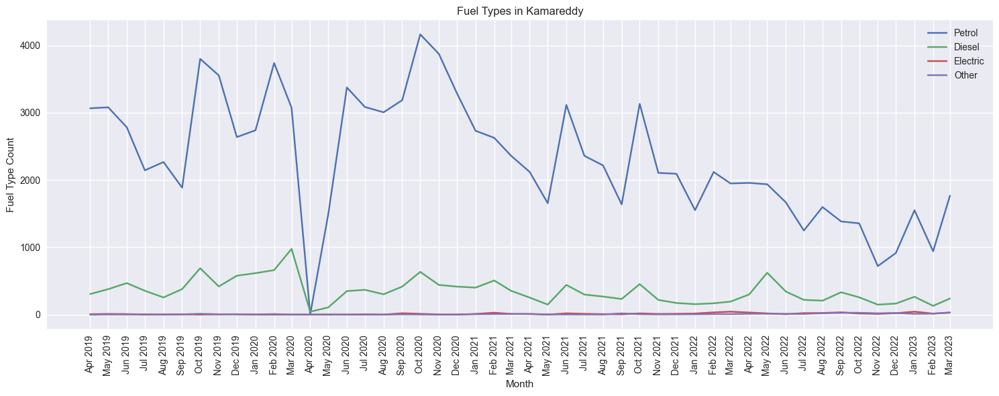

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


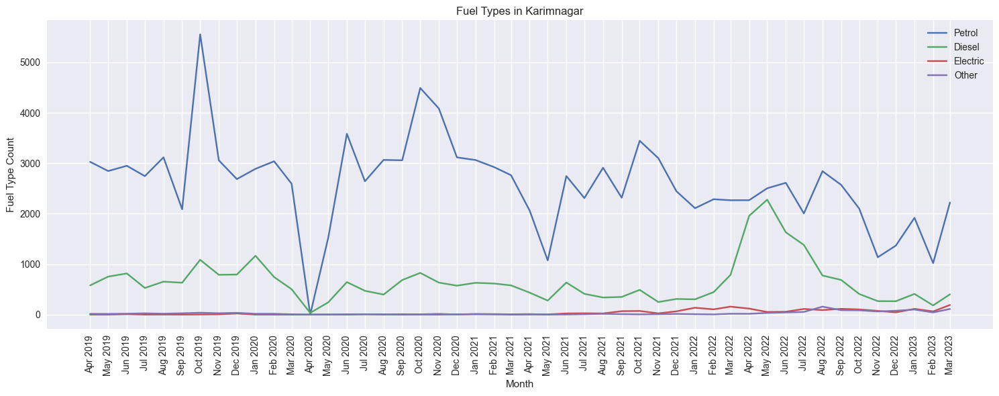

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


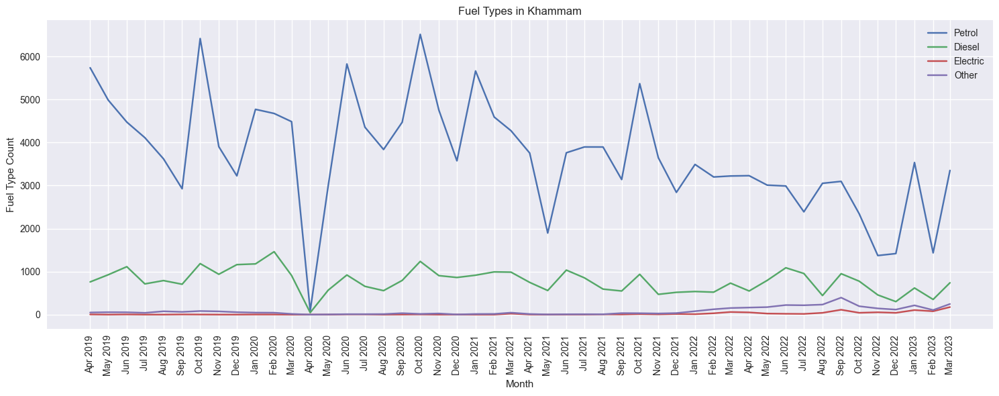

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


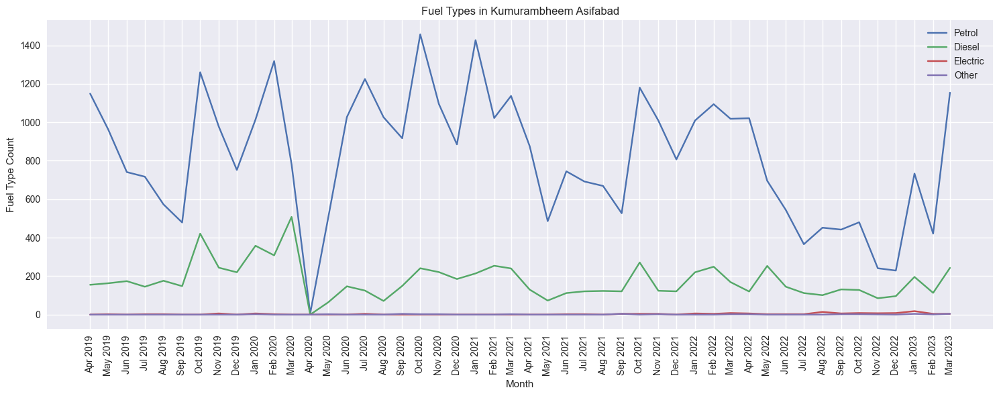

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


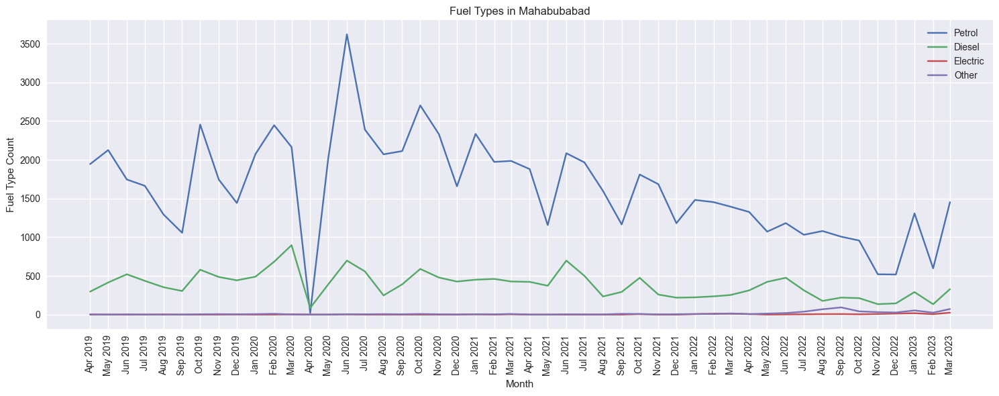

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


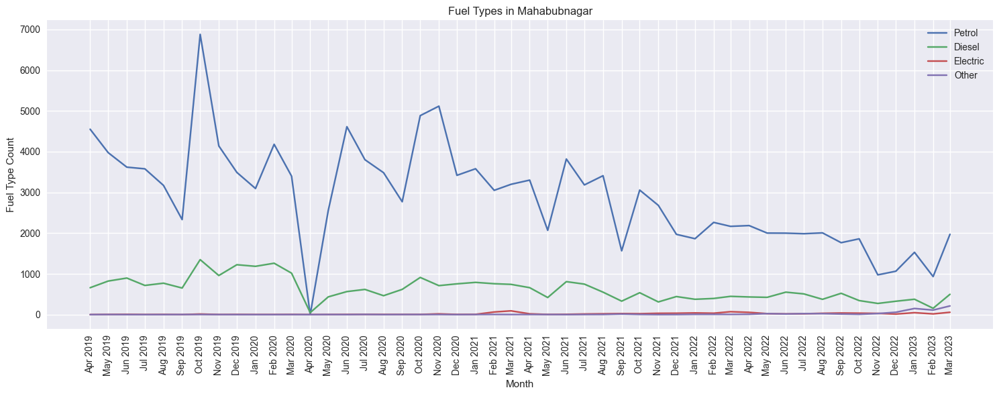

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


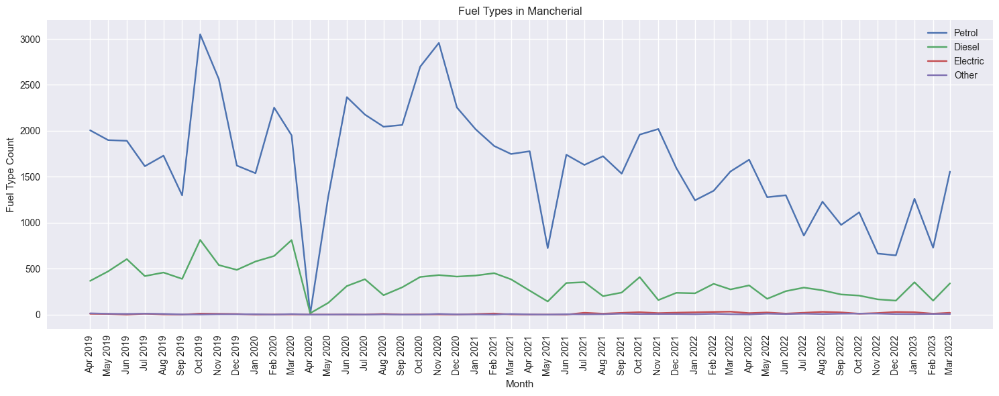

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


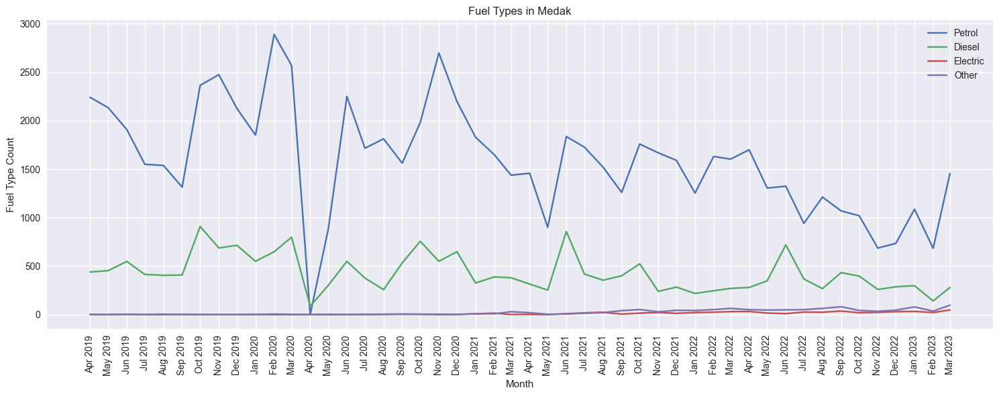

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


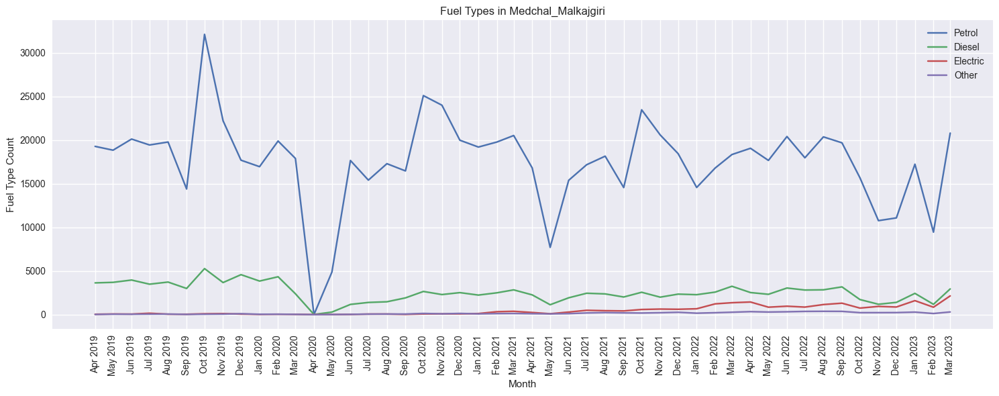

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


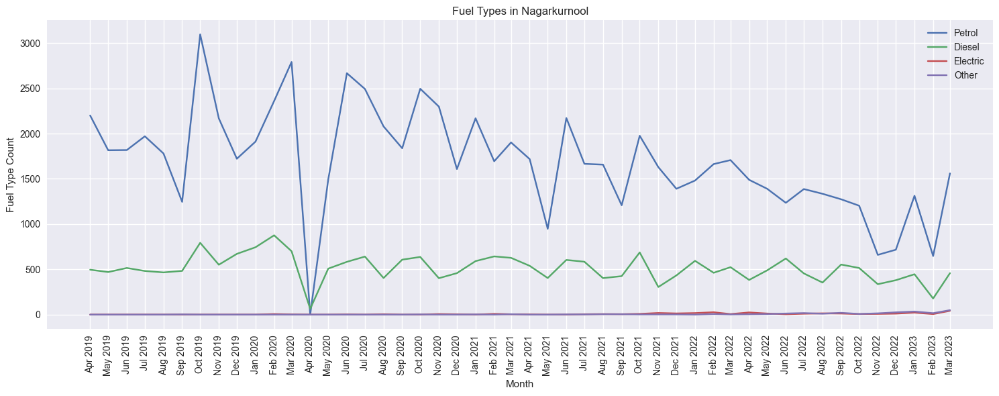

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


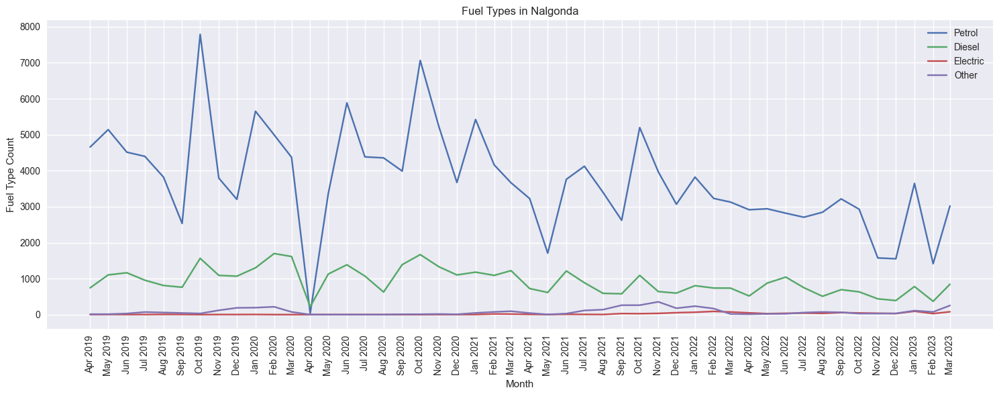

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


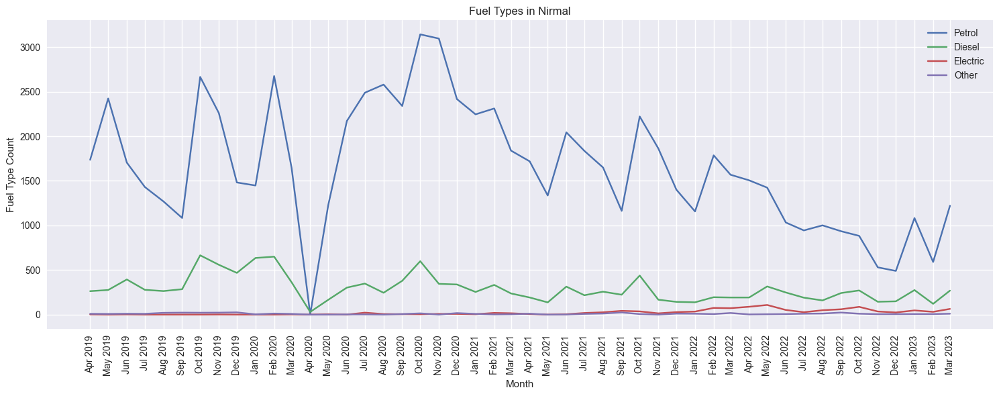

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


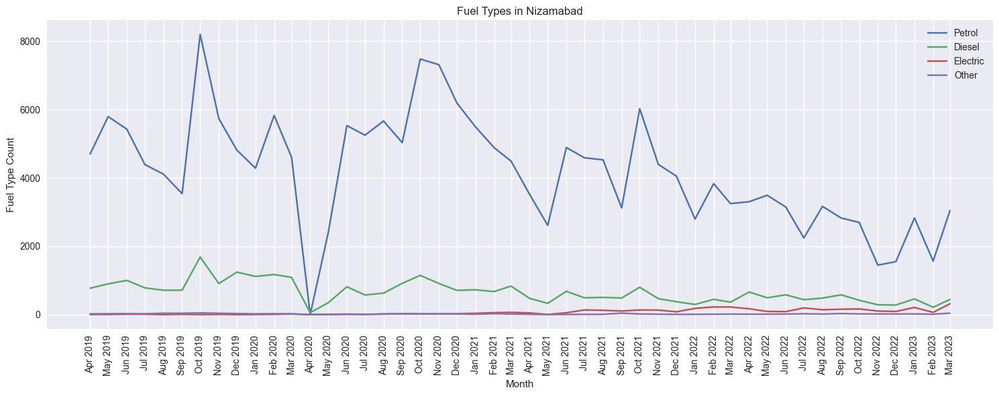

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


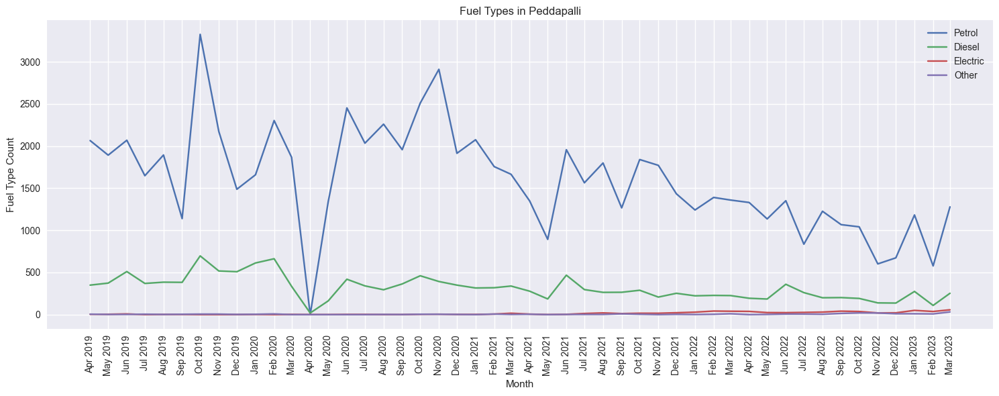

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


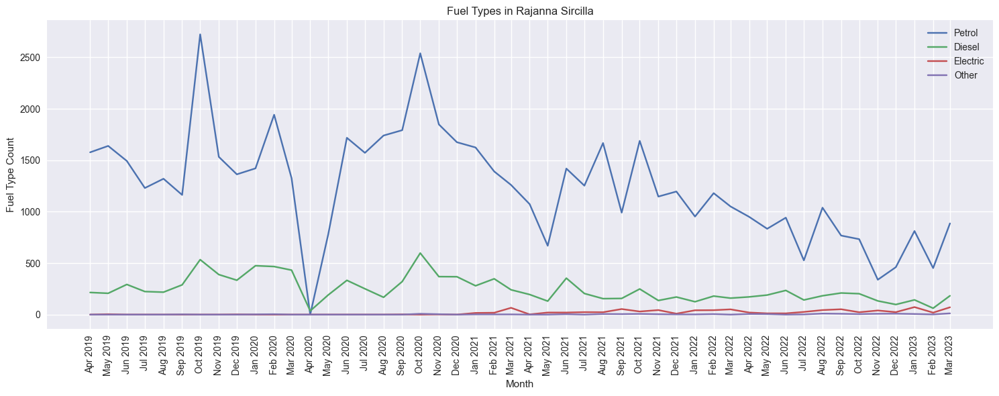

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


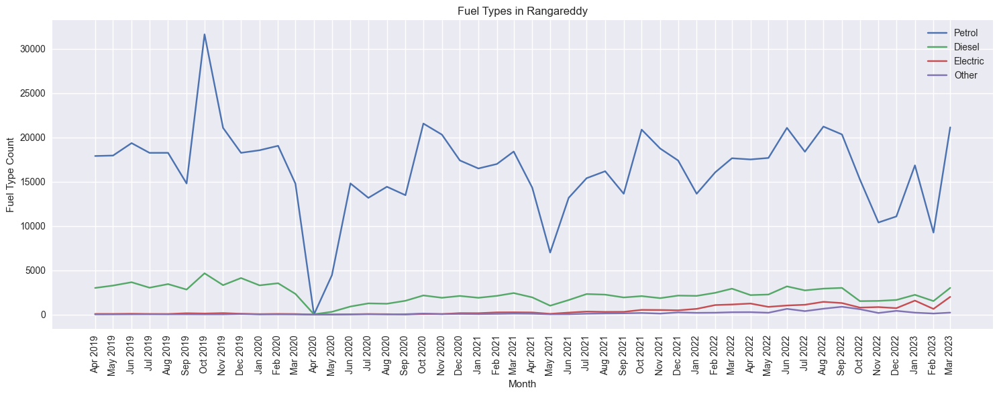

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


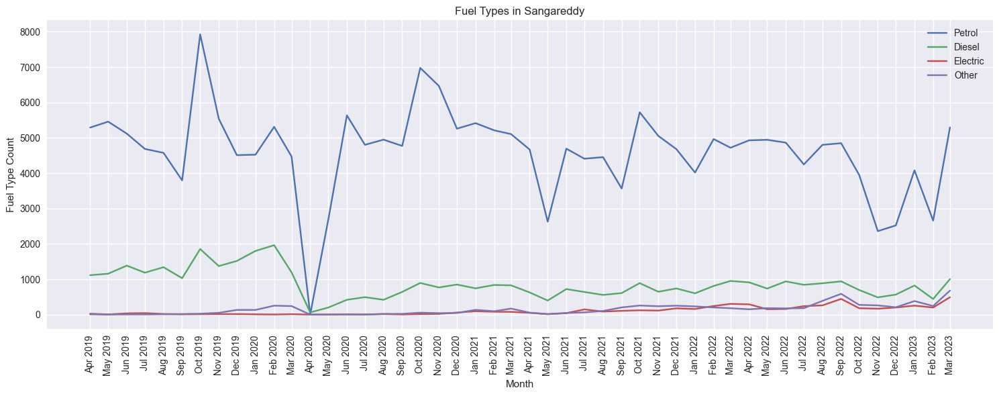

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


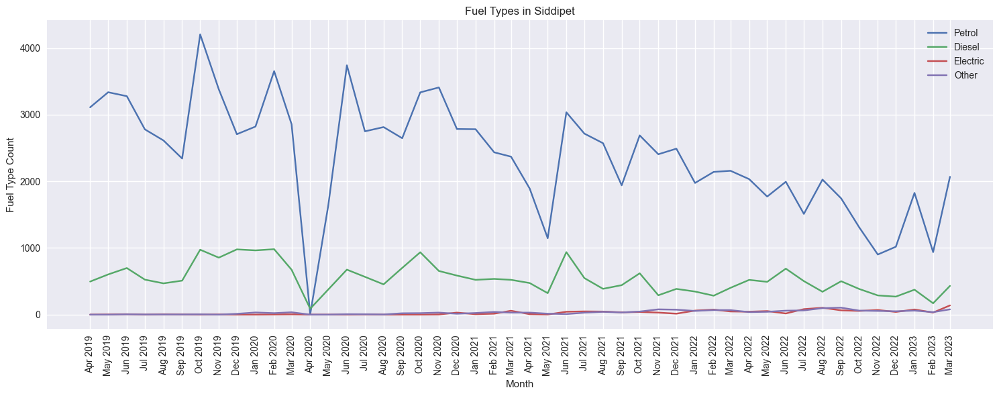

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


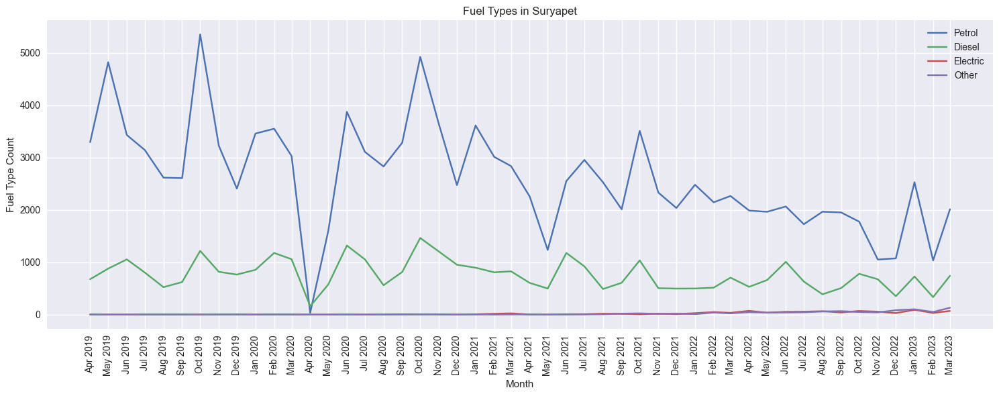

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


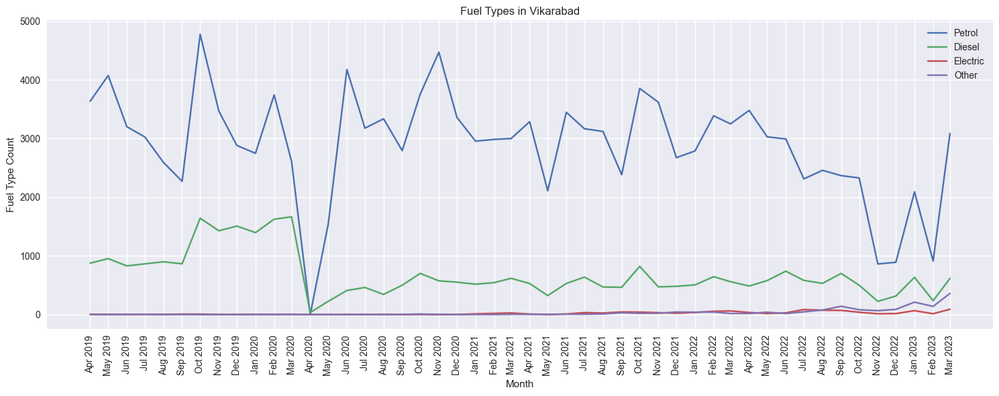

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


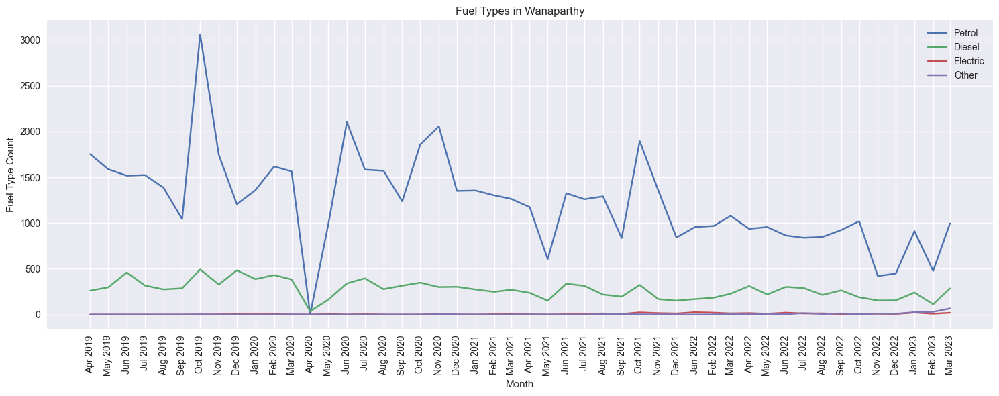

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


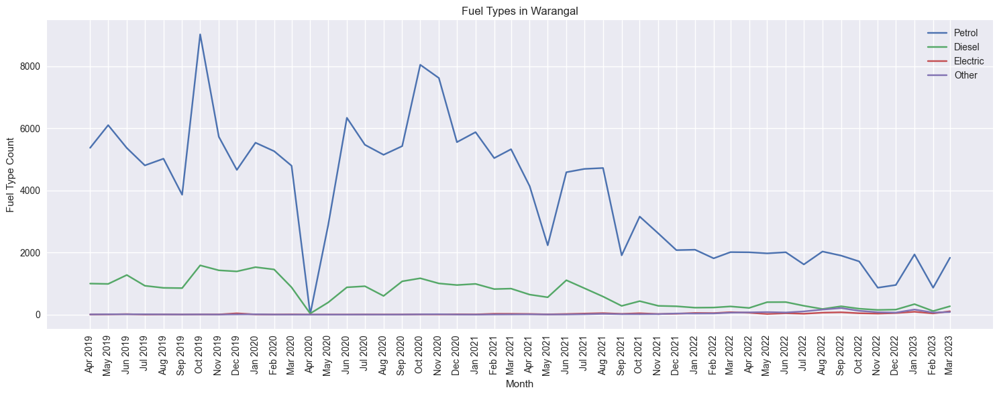

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\531235762.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))


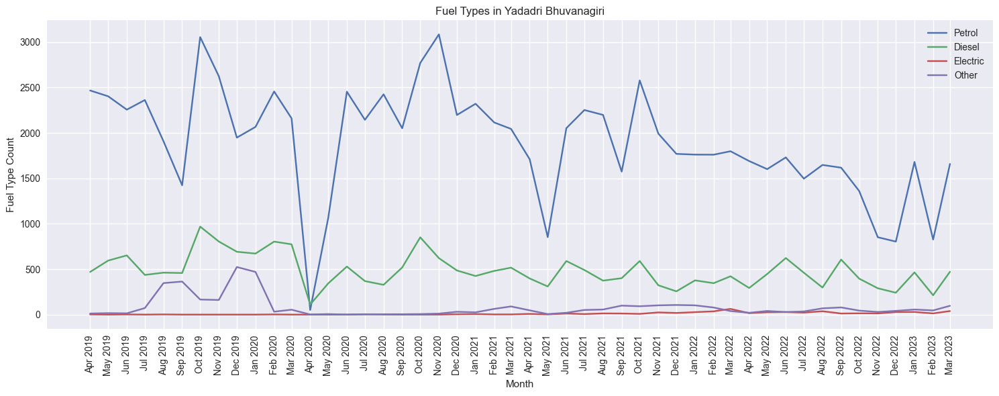

In [51]:
pivot_data = fact_transport.pivot_table(index=['month', 'district'], values=['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric', 'fuel_type_others'], aggfunc='sum')

# Calculate the number of unique districts
districts = pivot_data.index.get_level_values('district').unique()

# Iterate through each district and create separate plots
for district in districts:
    subset = pivot_data.xs(district, level='district')
    
    fig, ax = plt.subplots(figsize=(15, 6))
    
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_petrol'], label='Petrol')
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_diesel'], label='Diesel')
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_electric'], label='Electric')
    ax.plot(subset.index.get_level_values('month'), subset['fuel_type_others'], label='Other')

    ax.set_title(f'Fuel Types in {district}')
    ax.set_xlabel('Month')
    ax.set_ylabel('Fuel Type Count')
    ax.legend(loc='upper right')

    # Format the x-axis ticks to show only month and year
    ax.xaxis.set_major_formatter(plt.FixedFormatter(subset.index.get_level_values('month').strftime('%b %Y')))
    ax.set_xticks(subset.index.get_level_values('month'))
    ax.tick_params(axis='x', rotation=90)
    
    plt.tight_layout()

    # Save the plot to an image file (e.g., PNG format)
    #plt.savefig(f'fuel_type_plot_{district}.png')
    plt.show()


**6) How does the distribution of vehicles vary by vehicle class 
(MotorCycle, MotorCar, AutoRickshaw, Agriculture) across different 
districts? Are there any districts with a predominant preference for a 
specific vehicle class? Consider FY 2022 for analys**is.


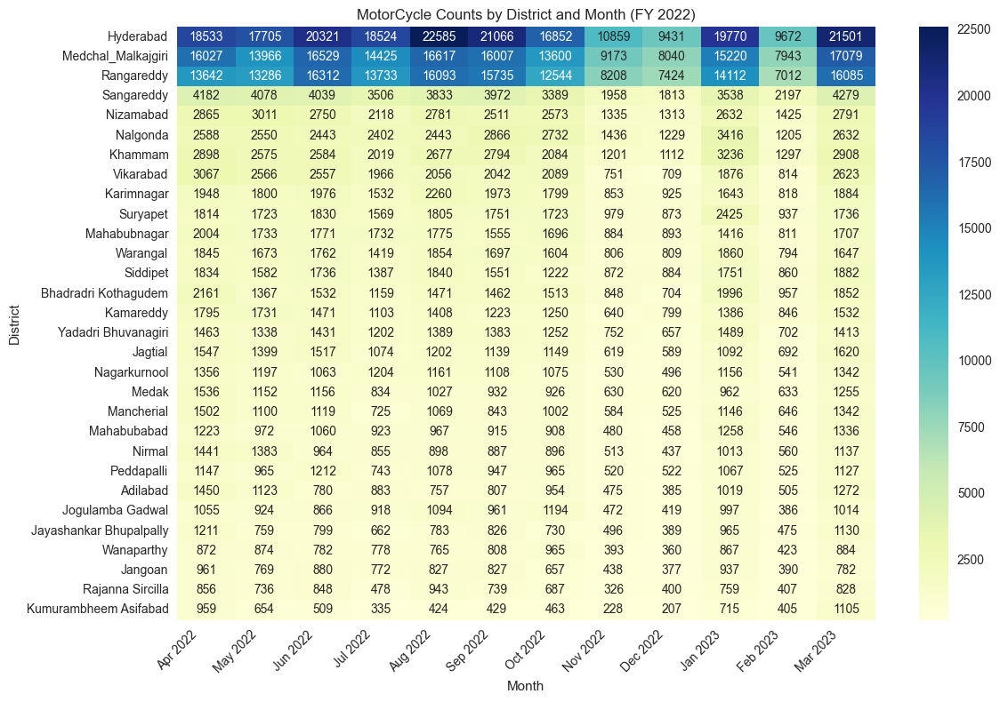

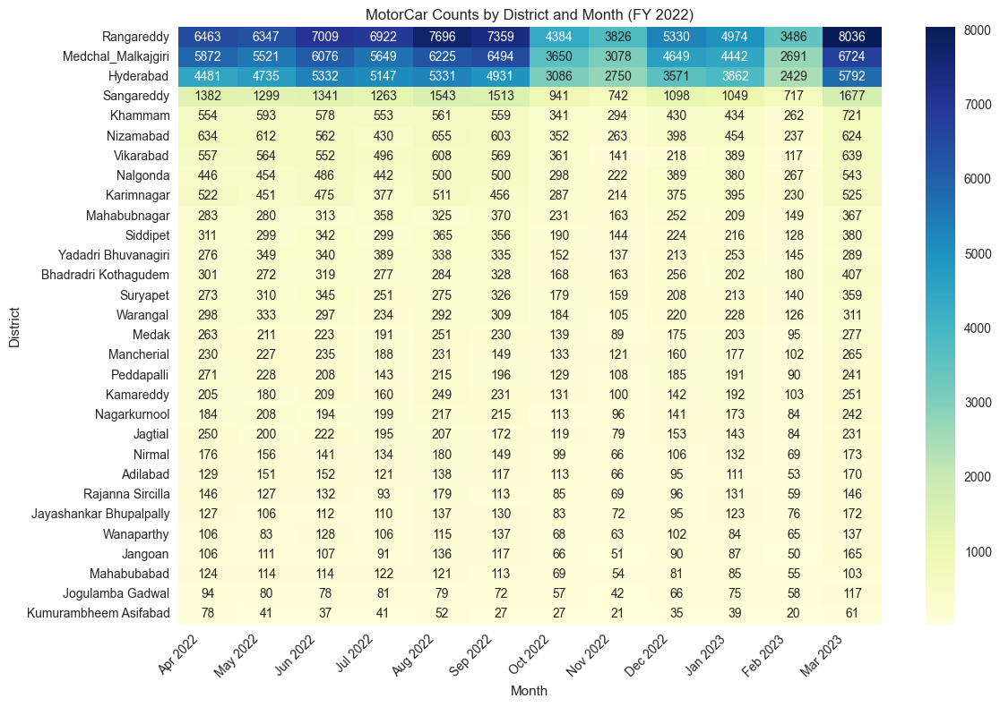

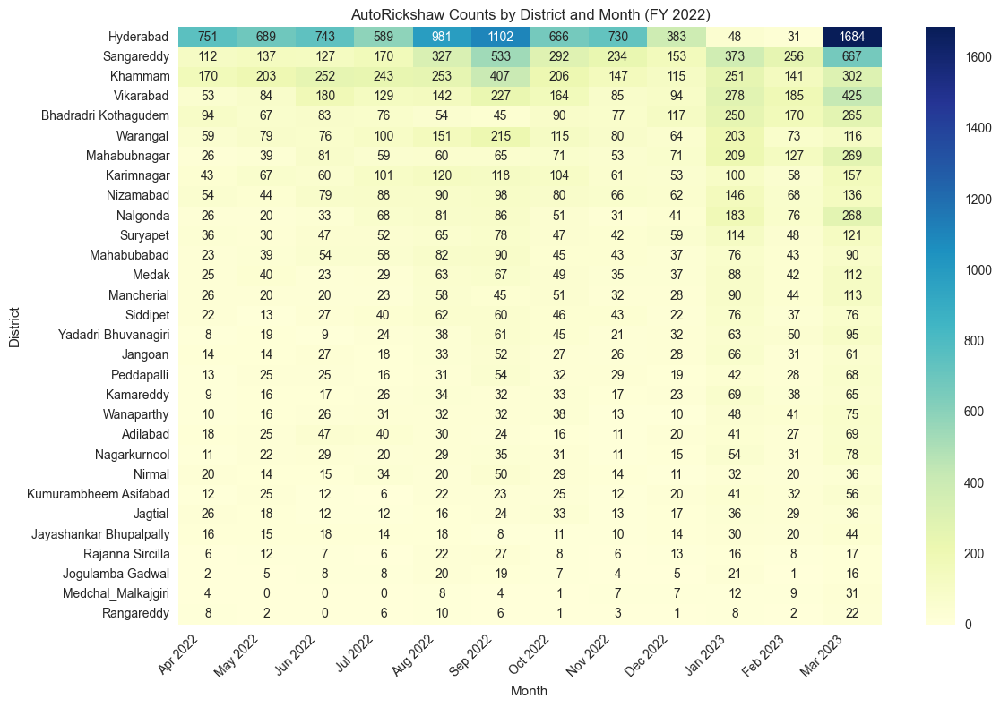

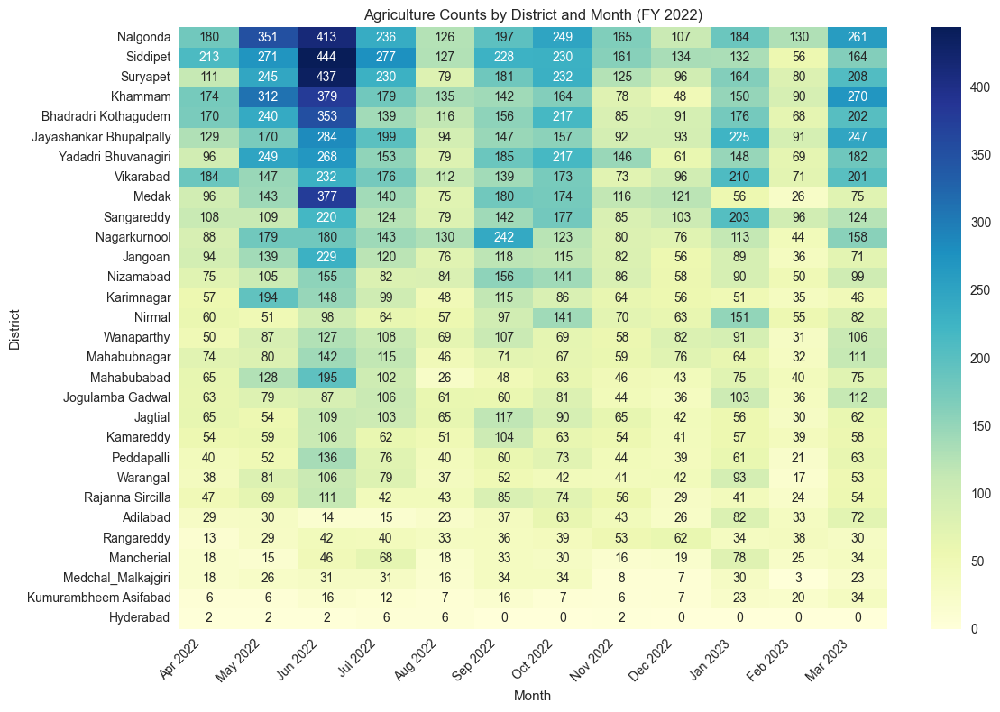

In [52]:
pivot_data = fact_transport.pivot_table(index=['month', 'district'], values=['vehicleClass_MotorCycle', 'vehicleClass_MotorCar', 'vehicleClass_AutoRickshaw', 'vehicleClass_Agriculture'], aggfunc='sum')
districts = pivot_data.index.get_level_values('district').unique()

# Filter the data for FY 2022
subset_fy_2022 = pivot_data.loc['2022-04-01':'2023-03-31']  # Assuming FY starts from April

# List of vehicle classes
vehicle_classes = ['MotorCycle', 'MotorCar', 'AutoRickshaw', 'Agriculture']

# Loop through each vehicle class and create a heatmap
for vehicle_class in vehicle_classes:
    plt.figure(figsize=(12, 8))
    
    # Sort the data by district counts in descending order for each vehicle class
    heatmap_data = subset_fy_2022.reset_index().pivot(index='district', columns='month', values=f'vehicleClass_{vehicle_class}')
    heatmap_data = heatmap_data.reindex(heatmap_data.sum(axis=1).sort_values(ascending=False).index, axis=0)
    
    sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="YlGnBu")
    
    # Set the x-axis ticks to show only year and month
    months = heatmap_data.columns
    plt.xticks(range(len(months)), [month.strftime('%b %Y') for month in months], rotation=45)

    plt.title(f'{vehicle_class} Counts by District and Month (FY 2022)')
    plt.xlabel('Month')
    plt.ylabel('District')
    plt.tight_layout()
    plt.show()

**7) List down the top 3 and bottom 3 districts that have shown the highest 
and lowest vehicle sales growth during FY 2022 compared to FY 
2021? (Consider and compare categories: Petrol, Diesel and Electric)**


In [54]:
fact_transport.head(2)

,dist_code,month,fuel_type_petrol,fuel_type_diesel,fuel_type_electric,fuel_type_others,vehicleClass_MotorCycle,vehicleClass_MotorCar,vehicleClass_AutoRickshaw,vehicleClass_Agriculture,vehicleClass_others,seatCapacity_1_to_3,seatCapacity_4_to_6,seatCapacity_above_6,Brand_new_vehicles,Pre-owned_vehicles,category_Non-Transport,category_Transport,district
0,15_1,2019-04-01,17910,3011,76,22,15308,4429,0,4,1278,16110,4182,717,19542,1477,19856,1163,Rangareddy
1,18_2,2019-04-01,3066,306,6,0,2995,142,49,64,128,3156,189,33,3322,56,3203,175,Kamareddy


In [55]:
# Convert the 'month' column to datetime format if it's not already
fact_transport['month'] = pd.to_datetime(fact_transport['month'])

# Define the start and end months for FY 2021 and FY 2022
fy2021_start_month = pd.Timestamp('2021-04-01')  # FY starts from April
fy2021_end_month = pd.Timestamp('2022-03-31')    # FY ends in March

fy2022_start_month = pd.Timestamp('2022-04-01')  # FY starts from April
fy2022_end_month = pd.Timestamp('2023-03-31')    # FY ends in March

# Filter the DataFrame to include only months within FY 2021 and FY 2022
fy2021_data = fact_transport[(fact_transport['month'] >= fy2021_start_month) & (fact_transport['month'] <= fy2021_end_month)]
fy2022_data = fact_transport[(fact_transport['month'] >= fy2022_start_month) & (fact_transport['month'] <= fy2022_end_month)]

# Group data by district and calculate the sum of each fuel type for FY 2021 and FY 2022
grouped_fy2021 = fy2021_data.groupby('district')[['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric']].sum()
grouped_fy2022 = fy2022_data.groupby('district')[['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric']].sum()

# Calculate growth percentages for each district and each fuel type
growth_columns = ['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric']
growth_percentages = (grouped_fy2022 - grouped_fy2021)

# Get the top and bottom districts for each fuel type sales growth in FY 2022 compared to FY 2021
top_bottom_fuel_growth = {}
for column in growth_columns:
    fuel_growth = growth_percentages[column]
    top_bottom_fuel_growth[column] = {
        'top': fuel_growth.sort_values(ascending=False).head(3),
        'bottom': fuel_growth.sort_values(ascending=False).tail(3)
    }

print("Top 3 and bottom 3 districts for each fuel type sales growth in FY 2022 compared to FY 2021 (in percentage):")
for column in growth_columns:
    print(f"Fuel Type: {column}")
    print("Top:\n", top_bottom_fuel_growth[column]['top'])
    print("Bottom:\n", top_bottom_fuel_growth[column]['bottom'])
    print()

Top 3 and bottom 3 districts for each fuel type sales growth in FY 2022 compared to FY 2021 (in percentage):
Fuel Type: fuel_type_petrol
Top:
 district
Rangareddy            16085
Hyderabad              2349
Medchal_Malkajgiri    -1826
Name: fuel_type_petrol, dtype: int64
Bottom:
 district
Mahabubnagar   -11070
Nizamabad      -16297
Warangal       -16331
Name: fuel_type_petrol, dtype: int64

Fuel Type: fuel_type_diesel
Top:
 district
Karimnagar    5610
Rangareddy    3132
Sangareddy    1082
Name: fuel_type_diesel, dtype: int64
Bottom:
 district
Mahabubnagar   -1239
Nalgonda       -1372
Warangal       -2746
Name: fuel_type_diesel, dtype: int64

Fuel Type: fuel_type_electric
Top:
 district
Hyderabad             11097
Rangareddy             7688
Medchal_Malkajgiri     6630
Name: fuel_type_electric, dtype: int64
Bottom:
 district
Mancherial          38
Jogulamba Gadwal    32
Wanaparthy           8
Name: fuel_type_electric, dtype: int64



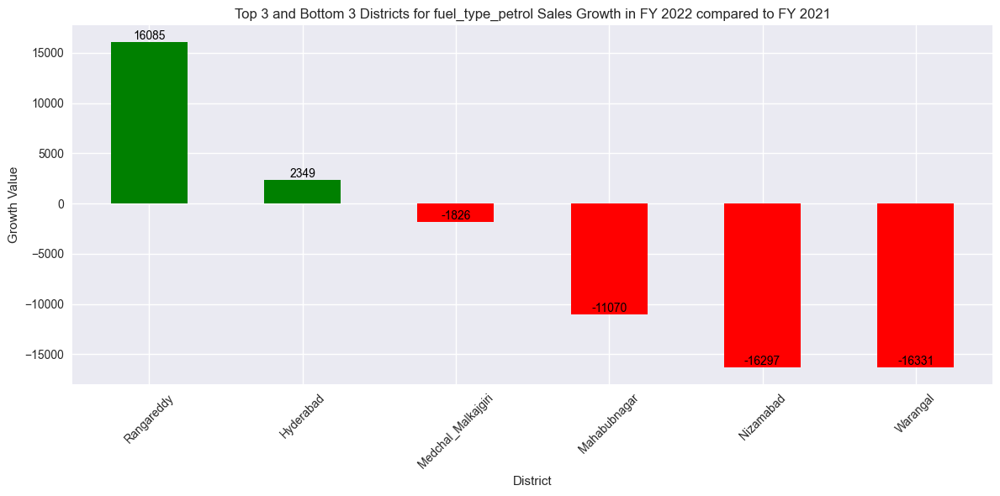

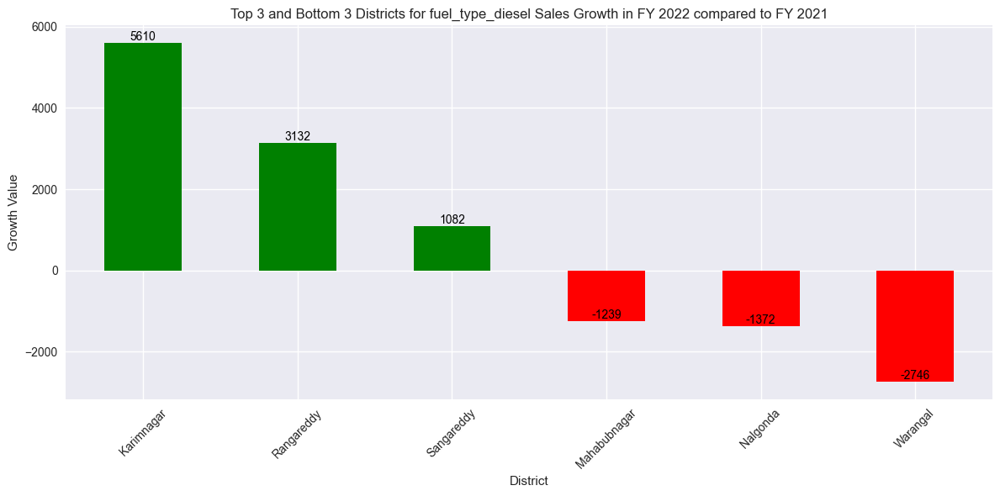

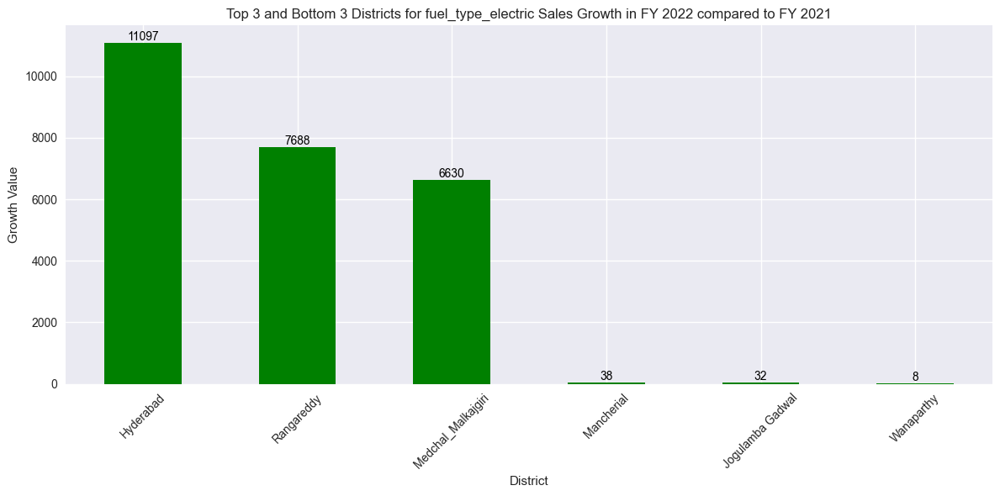

In [56]:
# Define the start and end months for FY 2021 and FY 2022
fy2021_start_month = pd.Timestamp('2021-04-01')  # FY starts from April
fy2021_end_month = pd.Timestamp('2022-03-31')    # FY ends in March

fy2022_start_month = pd.Timestamp('2022-04-01')  # FY starts from April
fy2022_end_month = pd.Timestamp('2023-03-31')    # FY ends in March

# Filter the DataFrame to include only months within FY 2021 and FY 2022
fy2021_data = fact_transport[(fact_transport['month'] >= fy2021_start_month) & (fact_transport['month'] <= fy2021_end_month)]
fy2022_data = fact_transport[(fact_transport['month'] >= fy2022_start_month) & (fact_transport['month'] <= fy2022_end_month)]

# Group data by district and calculate the sum of each fuel type for FY 2021 and FY 2022
grouped_fy2021 = fy2021_data.groupby('district')[['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric']].sum()
grouped_fy2022 = fy2022_data.groupby('district')[['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric']].sum()

# Calculate growth percentages for each district and each fuel type
growth_columns = ['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric']
growth_values = (grouped_fy2022 - grouped_fy2021)

# Get the top and bottom districts for each fuel type sales growth in FY 2022 compared to FY 2021
top_bottom_fuel_growth = {}
for column in growth_columns:
    fuel_growth = growth_values[column]
    top_bottom_fuel_growth[column] = {
        'top': fuel_growth.sort_values(ascending=False).head(3),
        'bottom': fuel_growth.sort_values(ascending=False).tail(3)
    }

# Plot bar charts for each fuel type
for column in growth_columns:
    plt.figure(figsize=(12, 6))
    
    # Concatenate the top and bottom dataframes for plotting
    plot_data = pd.concat([top_bottom_fuel_growth[column]['top'], top_bottom_fuel_growth[column]['bottom']])
    
    # Sort the data for better visualization
    plot_data = plot_data.sort_values(ascending=False)
    
    # Create a bar chart
    ax = plot_data.plot(kind='bar', color=['green' if value >= 0 else 'red' for value in plot_data])
    
    # Add annotations with numbers at the top of each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')
    
    plt.title(f'Top 3 and Bottom 3 Districts for {column} Sales Growth in FY 2022 compared to FY 2021')
    plt.xlabel('District')
    plt.ylabel('Growth Value')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# Analysis on

## Ts-Ipass (Telangana State Industrial Project Approval and Self Certification System)

In [57]:
fact_TS_iPASS = pd.read_csv('D:\\Data Science\\Code basics\\Challenge\\Challenge_7\\dataset\\fact_TS_iPASS.csv')
fact_TS_iPASS.head()

,dist_code,month,sector,investment in cr,number_of_employees
0,14_1,01-04-2019,Engineering,2.3200,15
1,19_1,01-04-2019,Engineering,0.6250,13
2,20_3,01-04-2019,Wood and Leather,0.2000,8
3,20_3,01-04-2019,Textiles,0.2675,27
4,21_5,01-04-2019,Electrical and Electronic Products,0.1200,5


In [58]:
fact_TS_iPASS.isnull().sum()

dist_code              0
month                  0
sector                 0
investment in cr       0
number_of_employees    0
dtype: int64

In [59]:
fact_TS_iPASS.describe()

,investment in cr,number_of_employees
count,5753.000000,5753.000000
mean,17.231612,117.344168
std,257.427190,1398.725287
min,0.000000,0.000000
25%,0.220000,7.000000
50%,0.740000,15.000000
75%,3.120000,40.000000
max,17793.350800,57000.000000


In [60]:
fact_TS_iPASS = pd.merge(fact_TS_iPASS, dim_districts, on='dist_code')

In [61]:
fact_TS_iPASS.head()

,dist_code,month,sector,investment in cr,number_of_employees,district
0,14_1,01-04-2019,Engineering,2.32,15,Mahabubnagar
1,14_1,01-04-2019,Paper and Printing,14.40,305,Mahabubnagar
2,14_1,01-05-2019,Pharmaceuticals and Chemicals,66.90,190,Mahabubnagar
3,14_1,01-05-2019,Granite and Stone Crushing,0.00,1000,Mahabubnagar
4,14_1,01-05-2019,Food Processing,3.78,90,Mahabubnagar


In [62]:
fact_TS_iPASS.describe()

,investment in cr,number_of_employees
count,5753.000000,5753.000000
mean,17.231612,117.344168
std,257.427190,1398.725287
min,0.000000,0.000000
25%,0.220000,7.000000
50%,0.740000,15.000000
75%,3.120000,40.000000
max,17793.350800,57000.000000


**8) List down the top 5 sectors that have witnessed the most significant 
investments in FY 2022**

In [63]:
fact_TS_iPASS['month'] = pd.to_datetime(fact_TS_iPASS['month'], format='%d-%m-%Y')

In [64]:
fact_TS_iPASS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5753 entries, 0 to 5752
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   dist_code            5753 non-null   object        
 1   month                5753 non-null   datetime64[ns]
 2   sector               5753 non-null   object        
 3   investment in cr     5753 non-null   float64       
 4   number_of_employees  5753 non-null   int64         
 5   district             5753 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(3)
memory usage: 269.8+ KB


In [65]:
fact_TS_iPASS.head()

,dist_code,month,sector,investment in cr,number_of_employees,district
0,14_1,2019-04-01,Engineering,2.32,15,Mahabubnagar
1,14_1,2019-04-01,Paper and Printing,14.40,305,Mahabubnagar
2,14_1,2019-05-01,Pharmaceuticals and Chemicals,66.90,190,Mahabubnagar
3,14_1,2019-05-01,Granite and Stone Crushing,0.00,1000,Mahabubnagar
4,14_1,2019-05-01,Food Processing,3.78,90,Mahabubnagar


In [66]:
# Filter data for the financial year April 1, 2022, to March 31, 2023
fy_2022_data = fact_TS_iPASS[(fact_TS_iPASS['month'] >= '2022-04-01') & (fact_TS_iPASS['month'] <= '2023-03-31')]

# Group data by sector and calculate total investment
sector_investment = fy_2022_data.groupby('sector')['investment in cr'].sum()

# Sort sectors by total investment in descending order
sorted_sectors = sector_investment.sort_values(ascending=False)

# Display the top 5 sectors
top_5_sectors = sorted_sectors.head(5)
print(top_5_sectors)

sector
Plastic and Rubber                               5855.6095
Pharmaceuticals and Chemicals                    2181.6342
Real Estate,Industrial Parks and IT Buildings    2127.2963
Solar and Other Renewable Energy                 2052.9850
Engineering                                      1877.4533
Name: investment in cr, dtype: float64


In [67]:
sorted_sectors

sector
Plastic and Rubber                                                             5855.6095
Pharmaceuticals and Chemicals                                                  2181.6342
Real Estate,Industrial Parks and IT Buildings                                  2127.2963
Solar and Other Renewable Energy                                               2052.9850
Engineering                                                                    1877.4533
Automobile                                                                     1567.4271
R&D                                                                            1484.9027
Food Processing                                                                1455.9435
Agro based incl Cold Storages                                                  1263.5502
Paper and Printing                                                             1251.3714
Cement, Cement & Concrete Products, Fly Ash Bricks                             1142.7468
Others        

In [68]:
sector_investment

sector
Agro based incl Cold Storages                                                  1263.5502
Automobile                                                                     1567.4271
Beverages                                                                       476.7425
Cement, Cement & Concrete Products, Fly Ash Bricks                             1142.7468
Electrical and Electronic Products                                              484.4655
Engineering                                                                    1877.4533
Fertlizers Organic and Inorganic,Pesticides,Insecticides, and Other Related      34.2244
Food Processing                                                                1455.9435
Granite and Stone Crushing                                                      946.7192
Industrial Parks and IT Buildings                                               280.4090
Others                                                                         1040.3561
Paper and Prin

In [69]:
fy_2022_data

,dist_code,month,sector,investment in cr,number_of_employees,district
120,14_1,2022-04-01,Pharmaceuticals and Chemicals,35.000,450,Mahabubnagar
121,14_1,2022-04-01,Others,47.000,60,Mahabubnagar
122,14_1,2022-04-01,Food Processing,6.000,5,Mahabubnagar
123,14_1,2022-04-01,Agro based incl Cold Storages,26.855,64,Mahabubnagar
124,14_1,2022-04-01,Solar and Other Renewable Energy,590.654,45,Mahabubnagar
...,...,...,...,...,...,...
5748,21_1,2023-03-01,Wood and Leather,0.200,1,Hanumakonda
5749,21_1,2023-03-01,Textiles,1.900,40,Hanumakonda
5750,21_1,2023-03-01,Others,0.180,12,Hanumakonda
5751,21_1,2023-03-01,"Cement, Cement & Concrete Products, Fly Ash Br...",0.310,16,Hanumakonda


In [70]:
fy_2022_data.describe()

,month,investment in cr,number_of_employees
count,1433,1433.000000,1433.000000
mean,2022-09-07 11:30:21.353803008,17.979037,71.083043
min,2022-04-01 00:00:00,0.000100,1.000000
25%,2022-06-01 00:00:00,0.250000,8.000000
50%,2022-09-01 00:00:00,1.015000,15.000000
75%,2022-12-01 00:00:00,4.813300,45.000000
max,2023-03-01 00:00:00,1556.073700,7000.000000
std,NaN,103.263047,323.941988


In [71]:
# Define the start and end dates of the financial year
fy_start_date = pd.Timestamp('2022-04-01')
fy_end_date = pd.Timestamp('2023-03-31')

# Filter data for the financial year April 1, 2022, to March 31, 2023
fy_2022_data = fact_TS_iPASS[(fact_TS_iPASS['month'] >= fy_start_date) & (fact_TS_iPASS['month'] <= fy_end_date)]

# Group data by sector and calculate total investment
sector_investment = fy_2022_data.groupby('sector')['investment in cr'].sum()

# Sort sectors by total investment in descending order
sorted_sectors = sector_investment.sort_values(ascending=False)

# Display the top 5 sectors
top_5_sectors = sorted_sectors.head(5)
print(top_5_sectors)

sector
Plastic and Rubber                               5855.6095
Pharmaceuticals and Chemicals                    2181.6342
Real Estate,Industrial Parks and IT Buildings    2127.2963
Solar and Other Renewable Energy                 2052.9850
Engineering                                      1877.4533
Name: investment in cr, dtype: float64


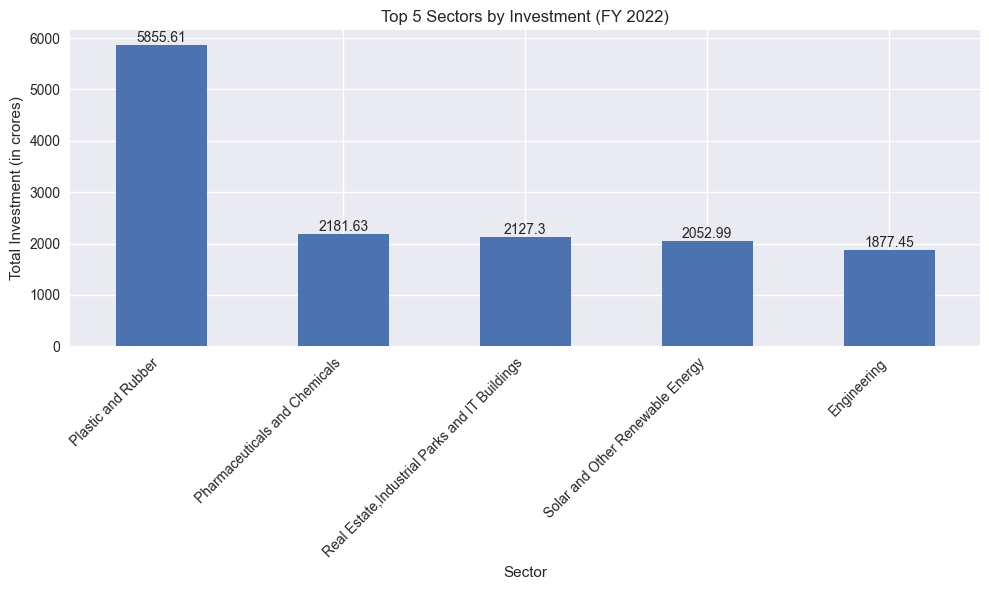

In [72]:
# Define the start and end dates of the financial year
fy_start_date = pd.Timestamp('2022-04-01')
fy_end_date = pd.Timestamp('2023-03-31')

# Filter data for the financial year April 1, 2022, to March 31, 2023
fy_2022_data = fact_TS_iPASS[(fact_TS_iPASS['month'] >= fy_start_date) & (fact_TS_iPASS['month'] <= fy_end_date)]

# Group data by sector and calculate total investment
sector_investment = fy_2022_data.groupby('sector')['investment in cr'].sum()

# Sort sectors by total investment in descending order
sorted_sectors = sector_investment.sort_values(ascending=False)

# Select the top 5 sectors
top_5_sectors = sorted_sectors.head(5)

# Create a bar plot with a violet background
plt.figure(figsize=(10, 6))
ax = plt.gca()
#ax.set_facecolor('#800080')  # Set the background color to violet

top_5_sectors.plot(kind='bar')
plt.title("Top 5 Sectors by Investment (FY 2022)")
plt.xlabel("Sector")
plt.ylabel("Total Investment (in crores)")
plt.xticks(rotation=45, ha='right')

# Add labels for the values at the top of each bar
for index, value in enumerate(top_5_sectors):
    plt.text(index, value, str(round(value, 2)), ha='center', va='bottom')

plt.tight_layout()
plt.show()

**9) List down the top 3 districts that have attracted the most significant 
sector investments during FY 2019 to 2022? What factors could have 
led to the substantial investments in these particular district**s?

In [73]:
fact_TS_iPASS['month'].unique()

<DatetimeArray>
['2019-04-01 00:00:00', '2019-05-01 00:00:00', '2019-06-01 00:00:00',
 '2019-07-01 00:00:00', '2019-08-01 00:00:00', '2019-09-01 00:00:00',
 '2019-10-01 00:00:00', '2019-11-01 00:00:00', '2019-12-01 00:00:00',
 '2020-01-01 00:00:00', '2020-02-01 00:00:00', '2020-03-01 00:00:00',
 '2020-04-01 00:00:00', '2020-05-01 00:00:00', '2020-06-01 00:00:00',
 '2020-07-01 00:00:00', '2020-08-01 00:00:00', '2020-09-01 00:00:00',
 '2020-10-01 00:00:00', '2020-11-01 00:00:00', '2020-12-01 00:00:00',
 '2021-01-01 00:00:00', '2021-02-01 00:00:00', '2021-03-01 00:00:00',
 '2021-04-01 00:00:00', '2021-05-01 00:00:00', '2021-06-01 00:00:00',
 '2021-07-01 00:00:00', '2021-08-01 00:00:00', '2021-09-01 00:00:00',
 '2021-10-01 00:00:00', '2021-11-01 00:00:00', '2021-12-01 00:00:00',
 '2022-01-01 00:00:00', '2022-02-01 00:00:00', '2022-03-01 00:00:00',
 '2022-04-01 00:00:00', '2022-05-01 00:00:00', '2022-06-01 00:00:00',
 '2022-07-01 00:00:00', '2022-08-01 00:00:00', '2022-09-01 00:00:00',
 '20

In [74]:
# Define the start and end dates of the financial years
fy_start_date = pd.Timestamp('2019-04-01')
fy_end_date = pd.Timestamp('2023-03-31')

# Filter data for the specified financial years
fy_data = fact_TS_iPASS[(fact_TS_iPASS['month'] >= fy_start_date) & (fact_TS_iPASS['month'] <= fy_end_date)]

# Group data by district and sector and calculate total investment
district_sector_investment = fy_data.groupby(['district', 'sector'])['investment in cr'].sum()

# Reset index to have a clean DataFrame for further analysis
district_sector_investment = district_sector_investment.reset_index()

# Group data by district and calculate total investment across sectors
district_investment = district_sector_investment.groupby('district')['investment in cr'].sum()

# Sort districts by total investment in descending order
sorted_districts = district_investment.sort_values(ascending=False)

# Display the top 3 districts
top_3_districts = round(sorted_districts.head(3),2)
top_3_districts

# Now, you can analyze potential factors that led to substantial investments in these districts.

district
Rangareddy            42706.33
Sangareddy            12366.76
Medchal_Malkajgiri    10394.56
Name: investment in cr, dtype: float64

**10) Is there any relationship between district investments, vehicles
 sales and stamps revenue within the same district between FY 2021
 and 202**2?

In [75]:
for i in top_3_districts.index:
    print(i)
    
    # Filtering data for Financial Year 2021 and 2022 based on month
    fact_stamps_filtered = fact_stamps[(fact_stamps['district'] == i) & (fact_stamps['month'].between('2021-04', '2022-03'))]
    doc_rev = fact_stamps_filtered['documents_registered_rev'].sum()
    
    # Filtering data for Financial Year 2021 and 2022 based on month
    fact_transport_filtered = fact_transport[(fact_transport['district'] == i) & (fact_transport['month'].between('2021-04', '2022-03'))]
    transport_sale = fact_transport_filtered[['fuel_type_petrol', 'fuel_type_diesel', 'fuel_type_electric', 'fuel_type_others']]
    total_sale = transport_sale['fuel_type_petrol'] + transport_sale['fuel_type_diesel'] + transport_sale['fuel_type_electric'] + transport_sale['fuel_type_others']

    # Filtering data for Financial Year 2021 and 2022 based on month
    fact_TS_iPASS_filtered = fact_TS_iPASS[(fact_TS_iPASS['district'] == i) & (fact_TS_iPASS['month'].between('2021-04', '2022-03'))]
    dist_investment = fact_TS_iPASS_filtered['investment in cr'].sum()
    #print(doc_rev, transport_sale)
    print(total_sale)

Rangareddy
736     16630
752      8139
809     15109
812     18175
863     18883
872     16049
927     23692
931     21245
975     20282
1014    16611
1020    19819
1078    21997
dtype: int64
Sangareddy
742     5401
770     3053
789     5503
817     5259
859     5200
889     4484
906     6993
935     6051
965     5850
1010    5010
1024    6221
1073    6155
dtype: int64
Medchal_Malkajgiri
739     19400
769      9013
790     17712
816     20297
860     21197
893     17187
907     26787
934     23431
964     21661
1011    17675
1023    20818
1074    23217
dtype: int64


In [76]:
fact_transport_filtered.columns

Index(['dist_code', 'month', 'fuel_type_petrol', 'fuel_type_diesel',
       'fuel_type_electric', 'fuel_type_others', 'vehicleClass_MotorCycle',
       'vehicleClass_MotorCar', 'vehicleClass_AutoRickshaw',
       'vehicleClass_Agriculture', 'vehicleClass_others',
       'seatCapacity_1_to_3', 'seatCapacity_4_to_6', 'seatCapacity_above_6',
       'Brand_new_vehicles', 'Pre-owned_vehicles', 'category_Non-Transport',
       'category_Transport', 'district'],
      dtype='object')

In [77]:
for i in top_3_districts.index:
    print(i)
    
    # Filtering data for Financial Year 2021 and 2022 based on month
    fact_stamps_filtered = fact_stamps[(fact_stamps['district'] == i) & (fact_stamps['month'].between('2021-04', '2023-03'))]
    doc_rev = fact_stamps_filtered['estamps_challans_rev'].sum()/10000000
    
    # Filtering data for Financial Year 2021 and 2022 based on month
    fact_transport_filtered = fact_transport[(fact_transport['district'] == i) & (fact_transport['month'].between('2021-04', '2023-03'))]
    transport_sale = fact_transport_filtered[['vehicleClass_MotorCycle','vehicleClass_MotorCar', 'vehicleClass_AutoRickshaw',
       'vehicleClass_Agriculture', 'vehicleClass_others']]
    
    # Calculate total sales across different fuel types
    total_sale = transport_sale.sum(axis=1)
    
    # Filtering data for Financial Year 2021 and 2022 based on month
    fact_TS_iPASS_filtered = fact_TS_iPASS[(fact_TS_iPASS['district'] == i) & (fact_TS_iPASS['month'].between('2021-04', '2023-03'))]
    dist_investment = fact_TS_iPASS_filtered['investment in cr'].sum()
    
    print(f"District: {i}")
    print(f"Total Document Revenue: {doc_rev}")
    print(f"Total Transport Sales: {total_sale.sum()}")  # Aggregate sales across different fuel types
    print(f"Total District Investment: {dist_investment}")
    print()

Rangareddy
District: Rangareddy
Total Document Revenue: 7068.2297387
Total Transport Sales: 463230
Total District Investment: 12480.6264

Sangareddy
District: Sangareddy
Total Document Revenue: 1478.2041561
Total Transport Sales: 130720
Total District Investment: 8776.5102

Medchal_Malkajgiri
District: Medchal_Malkajgiri
Total Document Revenue: 4234.4075412
Total Transport Sales: 483275
Total District Investment: 5364.1525



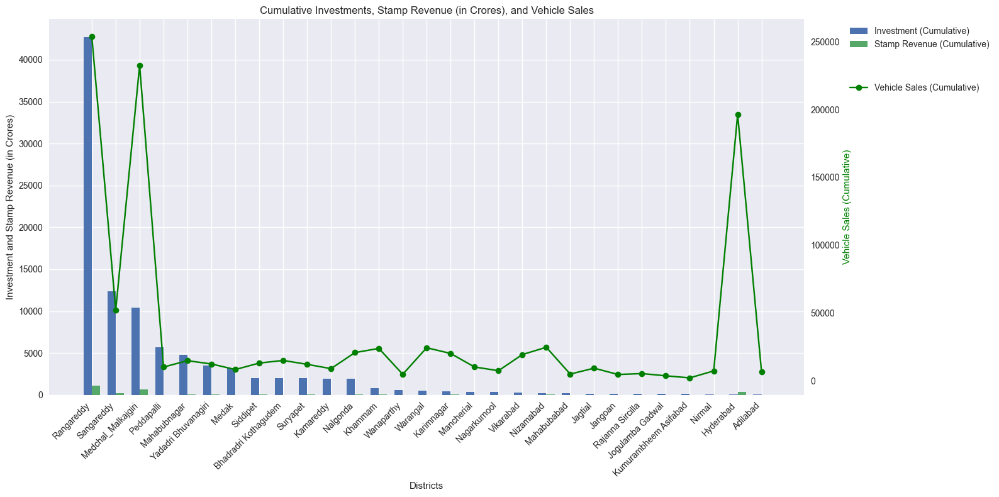

In [78]:
# Calculate cumulative sums for each DataFrame
fact_TS_iPASS['investment_cumulative'] = fact_TS_iPASS.groupby('district')['investment in cr'].cumsum()
fact_transport['vehicle_sales_cumulative'] = fact_transport.groupby('district')['vehicleClass_MotorCar'].cumsum()
fact_stamps['stamps_revenue_cumulative'] = fact_stamps.groupby('district')['documents_registered_rev'].cumsum() / 1e8  # Convert to Crores

# Merge the three DataFrames on 'district'
merged_df = fact_TS_iPASS.merge(fact_transport, on='district', how='inner')
merged_df = merged_df.merge(fact_stamps, on='district', how='inner')

# Create a pivot table for cumulative investments, stamps revenue, and vehicle sales
pivot_table = merged_df.pivot_table(index='district', values=['investment_cumulative', 'stamps_revenue_cumulative', 'vehicle_sales_cumulative'], aggfunc='max')

# Order the rows (districts) by investment in descending order
pivot_table = pivot_table.sort_values(by='investment_cumulative', ascending=False)

# Create a larger figure and axes
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot bar chart for cumulative investments and stamp revenue
bar_width = 0.35
index = np.arange(len(pivot_table))

investment = pivot_table['investment_cumulative']
stamp_revenue = pivot_table['stamps_revenue_cumulative']

ax1.bar(index - bar_width / 2, investment, width=bar_width, label='Investment (Cumulative)')
ax1.bar(index + bar_width / 2, stamp_revenue, width=bar_width, label='Stamp Revenue (Cumulative)')

ax1.set_xlabel('Districts')
ax1.set_ylabel('Investment and Stamp Revenue (in Crores)')
ax1.set_xticks(index)
ax1.set_xticklabels(pivot_table.index, rotation=45, ha='right')

# Create a second y-axis (right) for vehicle sales
ax2 = ax1.twinx()
vehicle_sales = pivot_table['vehicle_sales_cumulative']
ax2.plot(index, vehicle_sales, color='green', marker='o', label='Vehicle Sales (Cumulative)')

ax2.set_ylabel('Vehicle Sales (Cumulative)', color='green')

# Set titles and legends outside the chart and move the legend further to the right
plt.title('Cumulative Investments, Stamp Revenue (in Crores), and Vehicle Sales')
ax1.legend(loc='upper left', bbox_to_anchor=(1.05, 1), bbox_transform=ax1.transAxes)
ax2.legend(loc='upper left', bbox_to_anchor=(1.05, 0.85), bbox_transform=ax1.transAxes)

# Display the plot
plt.tight_layout()
plt.grid(axis='y')

plt.show()

In [79]:
fact_TS_iPASS.head(2)

,dist_code,month,sector,investment in cr,number_of_employees,district,investment_cumulative
0,14_1,2019-04-01,Engineering,2.32,15,Mahabubnagar,2.32
1,14_1,2019-04-01,Paper and Printing,14.40,305,Mahabubnagar,16.72


**11) Are there any particular sectors that have shown substantial investment in multiple districts between FY 2021 and 2022?**

In [80]:
fact_TS_iPASS['sector'].unique()

array(['Engineering', 'Paper and Printing',
       'Pharmaceuticals and Chemicals', 'Granite and Stone Crushing',
       'Food Processing', 'Electrical and Electronic Products',
       'Plastic and Rubber', 'R&D', 'Agro based incl Cold Storages',
       'Wood and Leather', 'Textiles', 'Others',
       'Cement, Cement & Concrete Products, Fly Ash Bricks',
       'Solar and Other Renewable Energy',
       'Fertlizers Organic and Inorganic,Pesticides,Insecticides, and Other Related',
       'Beverages', 'Automobile', 'Thermal Power Plant',
       'Real Estate,Industrial Parks and IT Buildings',
       'Industrial Parks and IT Buildings'], dtype=object)

C:\Users\Admin\AppData\Local\Temp\ipykernel_6800\4083078472.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  sector_colors = plt.cm.get_cmap('tab20', len(sector_district_investment['sector'].unique()))
C:\Users\Admin\anaconda3\envs\geo_env\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


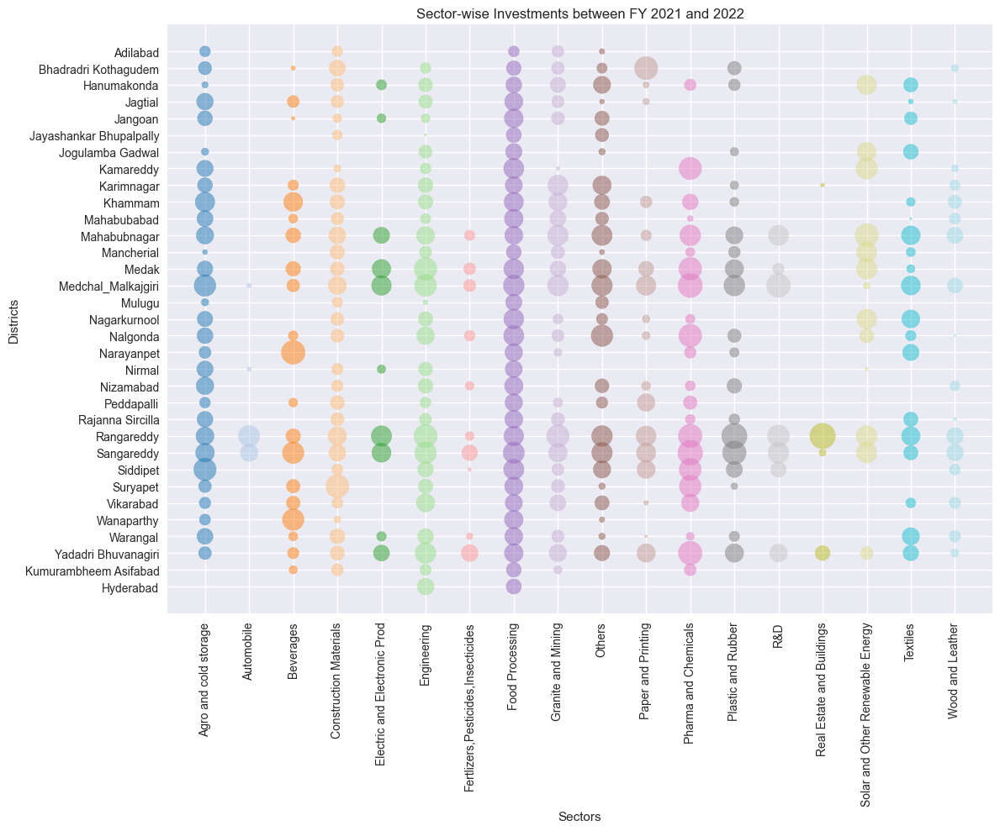

In [81]:
# Filter data for FY 2021 and FY 2022
fy_2021_2022_data = fact_TS_iPASS[
    (fact_TS_iPASS['month'].dt.year >= 2021) & (fact_TS_iPASS['month'].dt.year <= 2022)
]

# Group data by sector and district and calculate total investment
sector_district_investment = fy_2021_2022_data.groupby(['sector', 'district'])['investment in cr'].sum()

# Reset index for further processing
sector_district_investment = sector_district_investment.reset_index()

# Dictionary to map original sector names to customized names
sector_name_mapping = {
    'Pharmaceuticals and Chemicals': 'Pharma and Chemicals',
    'Granite and Stone Crushing': 'Granite and Mining',
    'Electrical and Electronic Products': 'Electric and Electronic Prod',
    'Agro based incl Cold Storages':'Agro and cold storage',
    'Cement, Cement & Concrete Products, Fly Ash Bricks':'Construction Materials',
    'Fertlizers Organic and Inorganic,Pesticides,Insecticides, and Other Related':'Fertlizers,Pesticides,Insecticides',
    'Real Estate,Industrial Parks and IT Buildings':'Real Estate and Buildings',
    # Add more sector name mappings as needed
}

# Apply sector name mapping
sector_district_investment['sector'] = sector_district_investment['sector'].replace(sector_name_mapping)

# Calculate bubble sizes based on the investment values using a logarithmic scale
bubble_sizes = sector_district_investment['investment in cr'].apply(lambda x: 50 * (1 + np.log(x)))

# Create a colormap for sectors
sector_colors = plt.cm.get_cmap('tab20', len(sector_district_investment['sector'].unique()))

# Create the bubble chart with color-coded sectors
plt.figure(figsize=(12, 10))  # Increase the figure height
plt.scatter(
    sector_district_investment['sector'],
    sector_district_investment['district'],
    s=bubble_sizes,
    c=sector_colors(sector_district_investment['sector'].factorize()[0]),
    alpha=0.5,
)

# Customize plot labels and title
plt.xlabel('Sectors')
plt.ylabel('Districts')
plt.title('Sector-wise Investments between FY 2021 and 2022')
plt.xticks(rotation=90)

# Adjust the layout to reduce congestion on the Y-axis
plt.gca().invert_yaxis()  # Reverse the Y-axis order

# Increase Y-axis tick size for better readability
plt.yticks(fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

In [82]:
sector_district_investment

,sector,district,investment in cr
0,Agro and cold storage,Adilabad,2.0400
1,Agro and cold storage,Bhadradri Kothagudem,4.9946
2,Agro and cold storage,Hanumakonda,0.6700
3,Agro and cold storage,Jagtial,22.3554
4,Agro and cold storage,Jangoan,10.0303
...,...,...,...
383,Wood and Leather,Siddipet,2.2300
384,Wood and Leather,Suryapet,0.0800
385,Wood and Leather,Vikarabad,2.5550
386,Wood and Leather,Warangal,2.6463


**12) Can we identify any seasonal patterns or cyclicality in the 
 investment trends for specific sectors? Do certain sectors 
 experience higher investments during particular month**s?


In [83]:
fact_TS_iPASS.head()

,dist_code,month,sector,investment in cr,number_of_employees,district,investment_cumulative
0,14_1,2019-04-01,Engineering,2.32,15,Mahabubnagar,2.32
1,14_1,2019-04-01,Paper and Printing,14.40,305,Mahabubnagar,16.72
2,14_1,2019-05-01,Pharmaceuticals and Chemicals,66.90,190,Mahabubnagar,83.62
3,14_1,2019-05-01,Granite and Stone Crushing,0.00,1000,Mahabubnagar,83.62
4,14_1,2019-05-01,Food Processing,3.78,90,Mahabubnagar,87.40


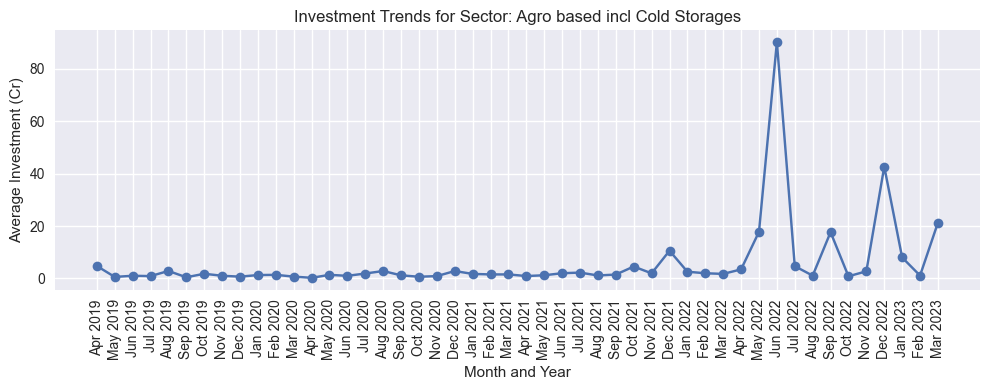

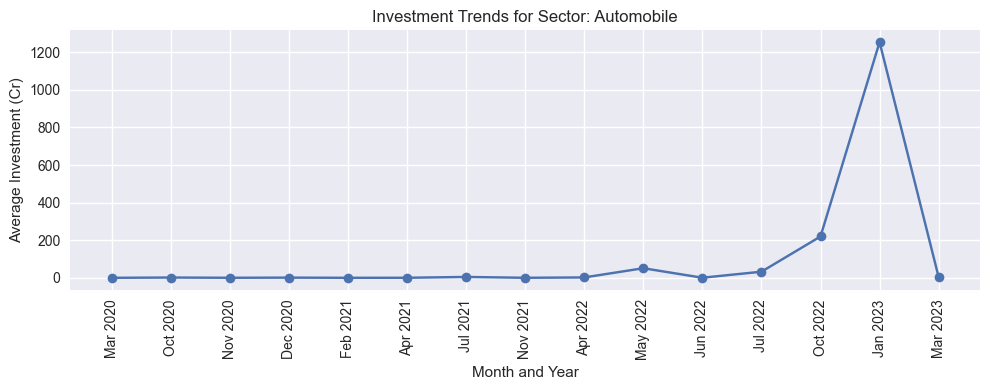

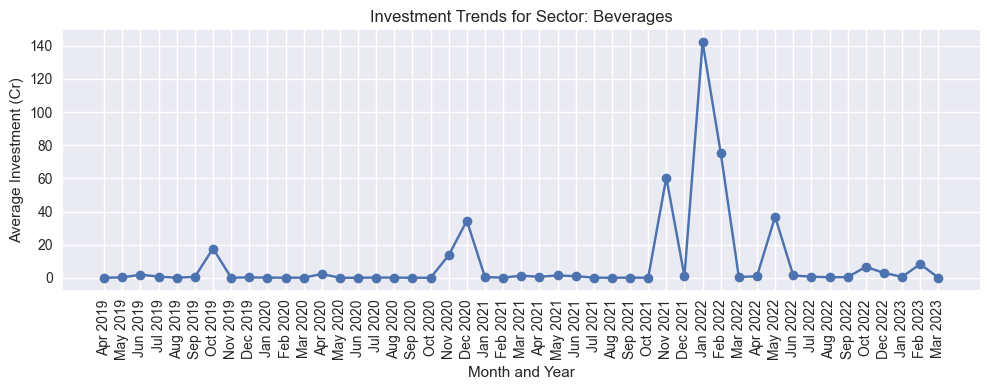

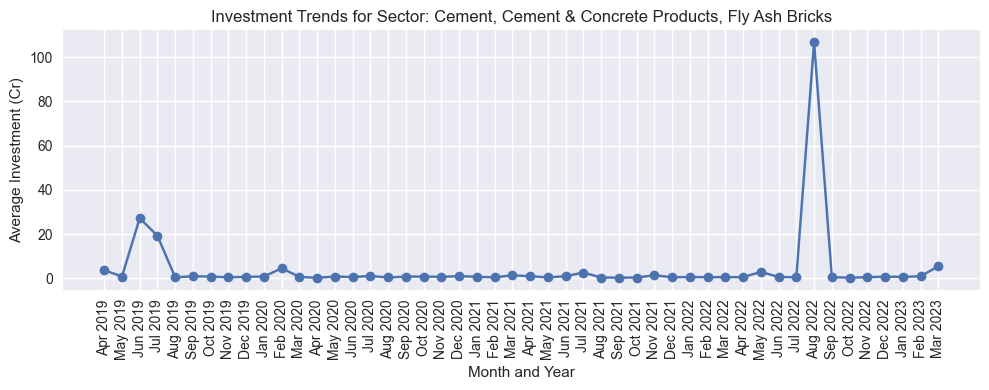

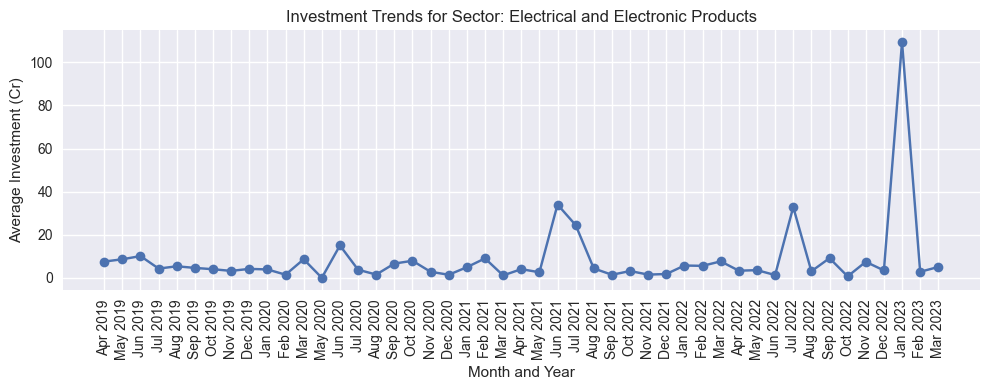

...

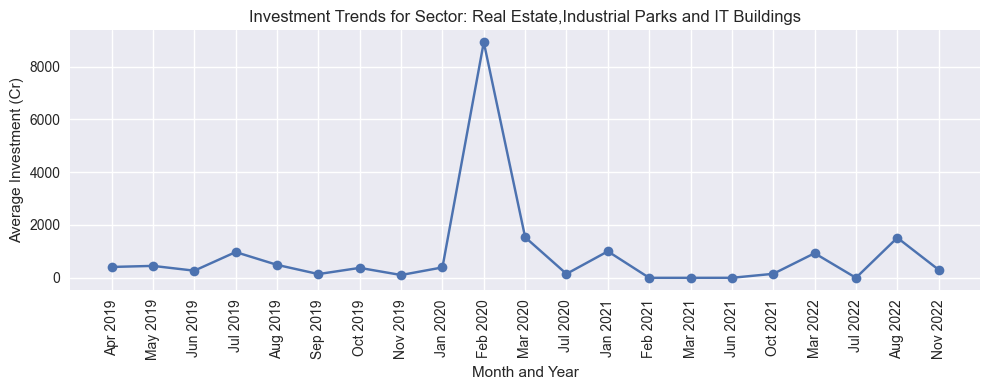

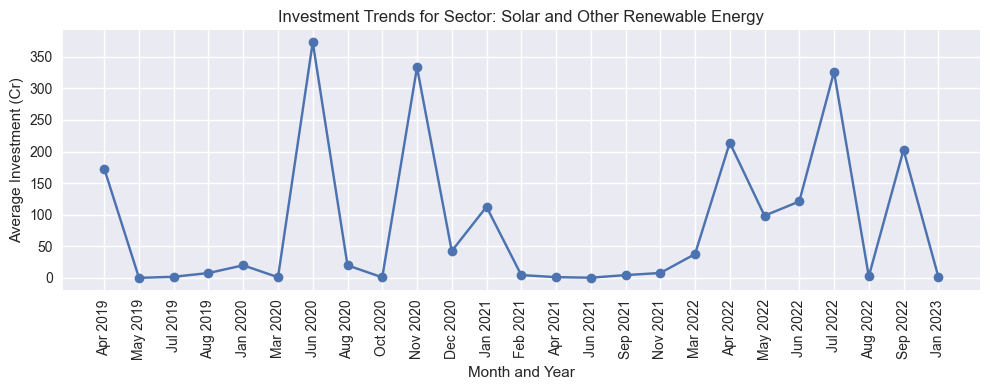

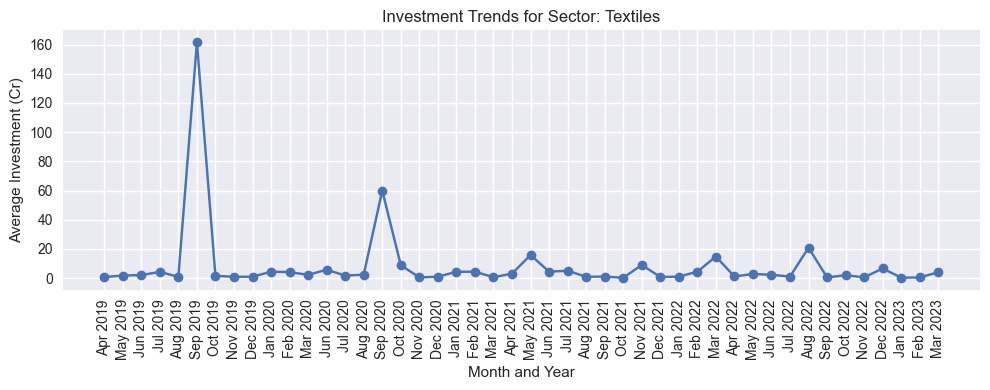

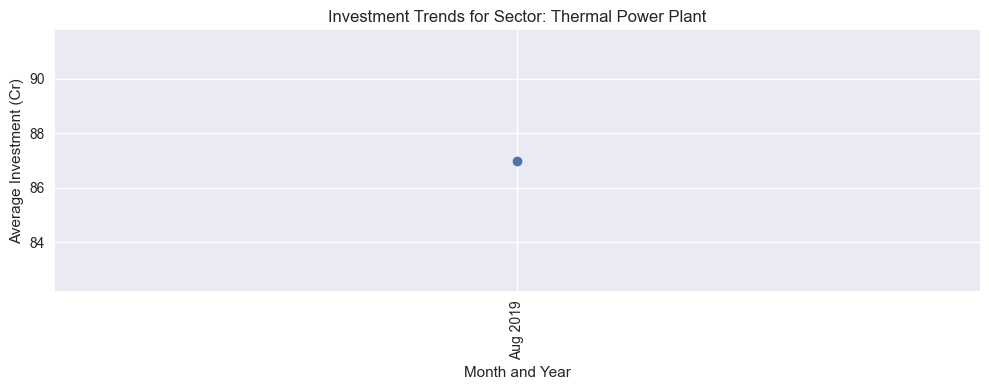

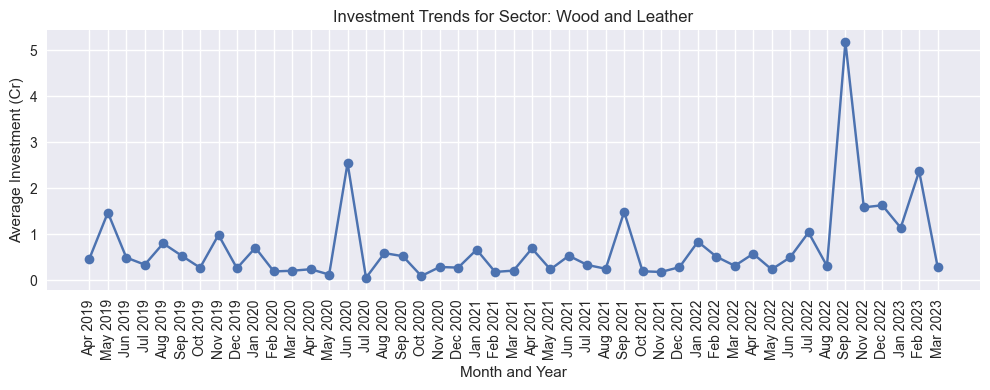

In [84]:
# Group data by sector
sector_groups = fact_TS_iPASS.groupby('sector')

# Visualize investment trends by sector and month using line plots
for sector, sector_data in sector_groups:
    plt.figure(figsize=(10, 4))  # Adjust the figsize as needed
    plt.title(f'Investment Trends for Sector: {sector}')
    
    # Group sector_data by month and calculate mean investment
    monthly_investment = sector_data.groupby(sector_data['month'].dt.to_period('M'))['investment in cr'].mean()
    
    # Plotting the investment trends
    plt.plot(monthly_investment.index.strftime('%b %Y'), monthly_investment.values, marker='o', linestyle='-')
    
    plt.xlabel('Month and Year')
    plt.ylabel('Average Investment (Cr)')
    plt.xticks(rotation=90)  # Rotate x-axis labels for readability
    
    plt.grid(True)
    plt.tight_layout()  # Adjust layout to prevent label cutoff
    plt.show()

# Secondary Research

**1. What are the top 5 districts to buy commercial properties in 
Telangana? Justify your answer.**

In [85]:
fact_TS_iPASS.head()

,dist_code,month,sector,investment in cr,number_of_employees,district,investment_cumulative
0,14_1,2019-04-01,Engineering,2.32,15,Mahabubnagar,2.32
1,14_1,2019-04-01,Paper and Printing,14.40,305,Mahabubnagar,16.72
2,14_1,2019-05-01,Pharmaceuticals and Chemicals,66.90,190,Mahabubnagar,83.62
3,14_1,2019-05-01,Granite and Stone Crushing,0.00,1000,Mahabubnagar,83.62
4,14_1,2019-05-01,Food Processing,3.78,90,Mahabubnagar,87.40


In [86]:
fact_TS_iPASS['sector'].unique()

array(['Engineering', 'Paper and Printing',
       'Pharmaceuticals and Chemicals', 'Granite and Stone Crushing',
       'Food Processing', 'Electrical and Electronic Products',
       'Plastic and Rubber', 'R&D', 'Agro based incl Cold Storages',
       'Wood and Leather', 'Textiles', 'Others',
       'Cement, Cement & Concrete Products, Fly Ash Bricks',
       'Solar and Other Renewable Energy',
       'Fertlizers Organic and Inorganic,Pesticides,Insecticides, and Other Related',
       'Beverages', 'Automobile', 'Thermal Power Plant',
       'Real Estate,Industrial Parks and IT Buildings',
       'Industrial Parks and IT Buildings'], dtype=object)

In [87]:
real_estate_filt = fact_TS_iPASS[fact_TS_iPASS['sector'] == 'Real Estate,Industrial Parks and IT Buildings']

In [88]:
ts_real_estate = real_estate_filt.groupby(['sector','district'])['investment in cr'].sum()

In [89]:
round(ts_real_estate.sort_values(ascending=False),2)

sector                                         district           
Real Estate,Industrial Parks and IT Buildings  Rangareddy             28970.27
                                               Medchal_Malkajgiri       776.49
                                               Sangareddy                20.96
                                               Yadadri Bhuvanagiri       10.00
                                               Karimnagar                 0.45
Name: investment in cr, dtype: float64